This notebook loads multimodal scRNA-Seq and scATAC-Seq data to study mouse bone marrow leukemia development using the MA9 model. The study focuses on investigating changes in mesenchymal stem cells (MSCs) during leukemic progression. The mouse genome used in this study has been modified to include additional fusion genes and extra genes as individual chromosomes (marker gene hNGFR, and  onco-fusion gene MLL-AF9), with corresponding annotations added to the GTF file.
- file adata_sel_udpate_may07.h5ad was used for next step. this file included combined MSC and HSC cell scRNA data for all the MLL-AF9 model samples. 


# import package


/home/whu78/conda3/envs/mar25/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm



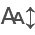

In [2]:
import os
import pandas as pd
import re
from muon import atac as ac
import numpy as np
import scanpy as sc
import anndata as ad
import muon as mu
import scipy
from scipy import sparse
import copy

import seaborn as sns
import scrublet as scr

import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import bbknn

#mport celltypist
#from celltypist import models

# Inital setting for plot size
from matplotlib import rcParams

FIGSIZE = (3, 3)
plt.rcParams["figure.figsize"] = FIGSIZE

from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))
display(HTML("<style>.output_result { max-width:100% !important; }</style>")) 

os.environ["PATH"] = os.environ["PATH"] + ':' + '/home/whu78/conda3/envs/feb24/bin:/home/whu78/conda3/envs/feb24/condabin:/hpcf/user_commands:/usr/NX/bin:/cm/local/apps/environment-modules/4.5.3/bin:/hpcf/lsf/lsf_prod/10.1/linux3.10-glibc2.17-x86_64/etc:/hpcf/lsf/lsf_prod/10.1/linux3.10-glibc2.17-x86_64/bin:/usr/lpp/mmfs/bin:/usr/lpp/mmfs/lib:/usr/local/bin:/usr/bin:/usr/local/sbin:/usr/sbin:/sbin:/usr/sbin:/cm/local/apps/environment-modules/4.5.3/bin:/usr/sbin:/sbin:/bin:/usr/bin:/etc:/usr/ucb:/usr/local/bin:/usr/local/local_dfs/bin:/usr/bin/X11:/usr/local/sas:/home/whu78/.local/bin:/home/whu78/bin'

from itables import init_notebook_mode
init_notebook_mode(all_interactive=True)

%matplotlib inline

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category = UserWarning)
warnings.filterwarnings("ignore", category = RuntimeWarning)


In [5]:
base_dir = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_JinWang/'
os.chdir(base_dir)

In [1]:
os.environ["R_HOME"] = "/home/whu78/conda3/envs/mar25/lib/R"

import rpy2.robjects as ro
%load_ext rpy2.ipython 


In [6]:
%%R -i base_dir
library(data.table)
setwd(base_dir)


R[write to console]: data.table 1.17.0 using 12 threads (see ?getDTthreads).  
R[write to console]: Latest news: r-datatable.com



In [8]:
%%R -i base_dir
library(data.table)
library(dplyr)
library(ChIPseeker)
library(TxDb.Hsapiens.UCSC.hg38.knownGene)
library(EnsDb.Hsapiens.v75)
library(clusterProfiler)
library(AnnotationDbi)
library(org.Hs.eg.db)
library(ggplot2)
library(gridExtra)
library(IRdisplay)
library(ChIPpeakAnno)
library(StructuralVariantAnnotation)
library(SingleCellExperiment)
library(anndata)
library(scDblFinder)

txdb <- TxDb.Hsapiens.UCSC.hg38.knownGene

setwd(base_dir)


# import design table

This design table is used to maintain sample and file location information and is consistently utilized across different analysis steps. New versions of the design table tried to remain compatible with older versions.

In [7]:
%R design = fread('data/dsn_dt_base_v2.tsv')
design = pd.read_csv('data/dsn_dt_base_v2.tsv', sep='\t')

In [8]:
%%R
file.exists(design$h5file)


 [1] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE


# load data for re-analysis

In [ ]:
adata_sel_bbknn = sc.read_h5ad('data/adata_sel_bbknn_Jul30.h5ad')
adata_sel = read_h5ad('data/adata_sel_Jul30.h5ad')
adata_sel_updated = sc.read_h5ad('data/adata_sel_updated_Jul30.h5ad')
adata_sel_updated_2 = sc.read_h5ad('data/adata_sel_updated_2_Jul30.h5ad')


In [170]:
adata_sel_updated_2.write_h5ad('data/adata_sel_updated_2_Jul30.h5ad')


# load all the samples and preprocess

## import data

In [12]:
# load data using as muon object
# this load both expression and atac results 
mdatas = [mu.read_10x_h5(fname) for fname in design['h5file']]
[mdata.var_names_make_unique() for mdata in mdatas]


Added `interval` annotation for features from /research/groups/jxugrp/home/common/Lab_Members/JinWang/cluster/multiome_merge/iMA9_arc_out_custom/H2/H2_merge_custom_out//outs/filtered_feature_bc_matrix.h5
Added peak annotation from /research/groups/jxugrp/home/common/Lab_Members/JinWang/cluster/multiome_merge/iMA9_arc_out_custom/H2/H2_merge_custom_out//outs/atac_peak_annotation.tsv to .uns['atac']['peak_annotation']
Added gene names to peak annotation in .uns['atac']['peak_annotation']
Located fragments file: /research/groups/jxugrp/home/common/Lab_Members/JinWang/cluster/multiome_merge/iMA9_arc_out_custom/H2/H2_merge_custom_out//outs/atac_fragments.tsv.gz
Added `interval` annotation for features from /research/groups/jxugrp/home/common/Lab_Members/JinWang/cluster/multiome_merge/iMA9_arc_out_custom/H3/H3_merge_custom_out//outs/filtered_feature_bc_matrix.h5
Added peak annotation from /research/groups/jxugrp/home/common/Lab_Members/JinWang/cluster/multiome_merge/iMA9_arc_out_custom/H3/H3_

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

In [13]:
# check if these created genes were exist in this new datasets
[mdatas[ii].mod['rna'].var.index[mdatas[ii].mod['rna'].var.index.isin(['MLL-AF9', 'hNGFR'])] for ii in [0,1,2,8,9,10]]


[Index(['MLL-AF9', 'hNGFR'], dtype='object'),
 Index(['MLL-AF9', 'hNGFR'], dtype='object'),
 Index(['MLL-AF9', 'hNGFR'], dtype='object'),
 Index([], dtype='object'),
 Index([], dtype='object'),
 Index([], dtype='object')]

## pre-processing


In [14]:
for mdata in mdatas:
    rna = mdata.mod['rna']
    rna.var['mt'] = rna.var_names.str.startswith('mt-') 
    rna.var["ribo"] = rna.var_names.str.startswith(("Rps", "Rpl"))
    rna.var["hb"] = rna.var_names.str.contains(("^Hb[^(p)]"))
    sc.pp.calculate_qc_metrics(rna, qc_vars=['mt', 'ribo', 'hb'], percent_top=None, log1p=False, inplace=True)


In [15]:
for mdata in mdatas:
    atac = mdata.mod['atac']
    sc.pp.calculate_qc_metrics(atac, percent_top=None, log1p=False, inplace=True)
    ac.tl.nucleosome_signal(atac, n=1e6)


















eading Fragments: 100%|██████████| 1000000/1000000 [00:02<00:00, 392970.85it/s]

## qc summary for individual samples
datasets were in good shape

### qc for rnaseq

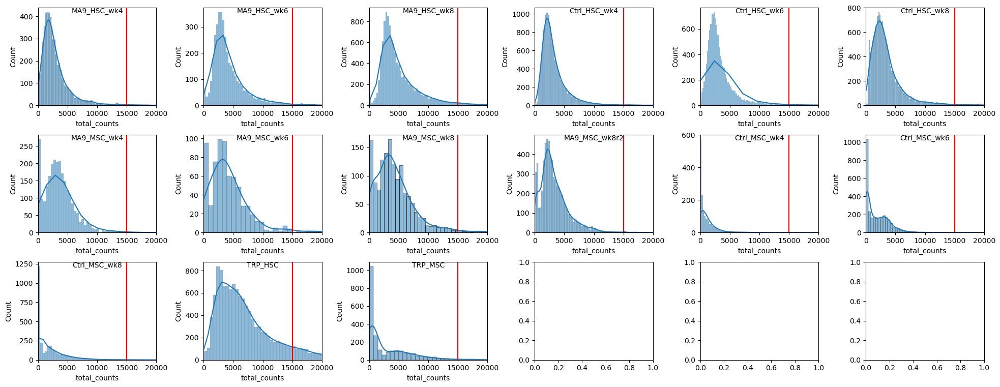

In [20]:
ncol = 6; nrow = 3; row_hight = 3; col_width = 4; wspace = 0.1; hspace = 0.4
fig, axes = plt.subplots(nrow , ncol, figsize=(ncol * col_width, nrow * row_hight) )
for ii, ax in enumerate(axes.flatten()):
    if ii == design.shape[0]:
        break
    else:
        ii_sample_name = design.loc[ii, 'sample_name']
        ii_title = design.loc[ii, 'sampleID']
        sns.histplot(mdatas[ii].mod['rna'].obs["total_counts"], kde=True, ax=ax)
        ax.set_xlim(0, 20000)
        xx = np.sum(ax.get_xlim()) / 2
        yy = np.max(ax.get_ylim())
        ax.text(x = xx, y = yy, s = ii_title, verticalalignment ='top', horizontalalignment ='center')
        ax.axvline(15000, color = 'red')
plt.subplots_adjust(hspace=0.3, wspace = .4)
plt.show()

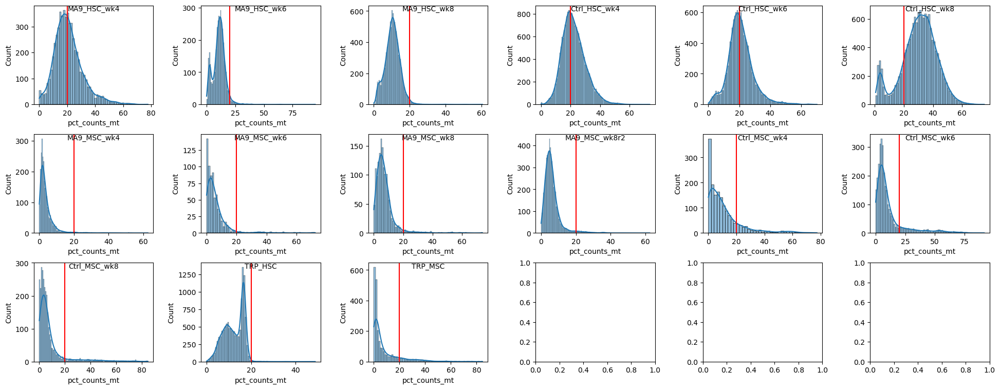

In [21]:
ncol = 6; nrow = 3; row_hight = 3; col_width = 4; wspace = 0.1; hspace = 0.4
fig, axes = plt.subplots(nrow , ncol, figsize=(ncol * col_width, nrow * row_hight) ) #ncol * figsize + (ncol - 1) * wspace * figsize, nrow * figsize + (nrow-1) * hspace * figsize) )
for ii, ax in enumerate(axes.flatten()):
    if ii == design.shape[0]:
        break
    else:
        ii_sample_name = design.loc[ii, 'sample_name']
        ii_title = design.loc[ii, 'sampleID']
        sns.histplot(mdatas[ii].mod['rna'].obs["pct_counts_mt"], kde=True, ax=ax)
        #ax.set_xlim(0, 20000)
        xx = np.sum(ax.get_xlim()) / 2
        yy = np.max(ax.get_ylim())
        ax.text(x = xx, y = yy, s = ii_title, verticalalignment ='top', horizontalalignment ='center')
        ax.axvline(20, color = 'red')
plt.subplots_adjust(hspace=0.3, wspace = .4)
plt.show()

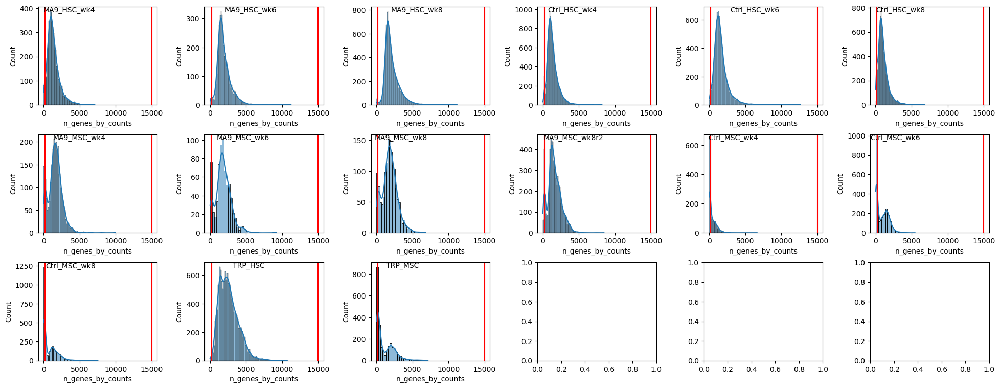

In [22]:
ncol = 6; nrow = 3; row_hight = 3; col_width = 4; wspace = 0.1; hspace = 0.4
fig, axes = plt.subplots(nrow , ncol, figsize=(ncol * col_width, nrow * row_hight) ) #ncol * figsize + (ncol - 1) * wspace * figsize, nrow * figsize + (nrow-1) * hspace * figsize) )
for ii, ax in enumerate(axes.flatten()):
    if ii == design.shape[0]:
        break
    else:
        ii_sample_name = design.loc[ii, 'sample_name']
        ii_title = design.loc[ii, 'sampleID']
        sns.histplot(mdatas[ii].mod['rna'].obs["n_genes_by_counts"], kde=True, ax=ax)
        #ax.set_xlim(0, 20000)
        xx = np.sum(ax.get_xlim()) / 2
        yy = np.max(ax.get_ylim())
        ax.text(x = xx, y = yy, s = ii_title, verticalalignment ='top', horizontalalignment ='center')
        ax.axvline(200, color = 'red')
        ax.axvline(15000, color = 'red')
plt.subplots_adjust(hspace=0.3, wspace = .4)
plt.show()

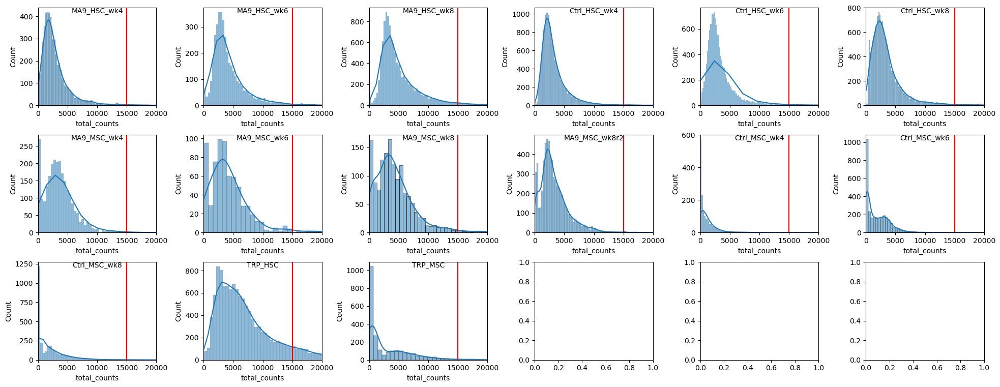

In [23]:
ncol = 6; nrow = 3; row_hight = 3; col_width = 4; wspace = 0.1; hspace = 0.4
fig, axes = plt.subplots(nrow , ncol, figsize=(ncol * col_width, nrow * row_hight) )
for ii, ax in enumerate(axes.flatten()):
    if ii == design.shape[0]:
        break
    else:
        ii_sample_name = design.loc[ii, 'sample_name']
        ii_title = design.loc[ii, 'sampleID']
        sns.histplot(mdatas[ii].mod['rna'].obs["total_counts"], kde=True, ax=ax)
        ax.set_xlim(0, 20000)
        xx = np.sum(ax.get_xlim()) / 2
        yy = np.max(ax.get_ylim())
        ax.text(x = xx, y = yy, s = ii_title, verticalalignment ='top', horizontalalignment ='center')
        ax.axvline(15000, color = 'red')
plt.subplots_adjust(hspace=0.3, wspace = .4)
plt.show()

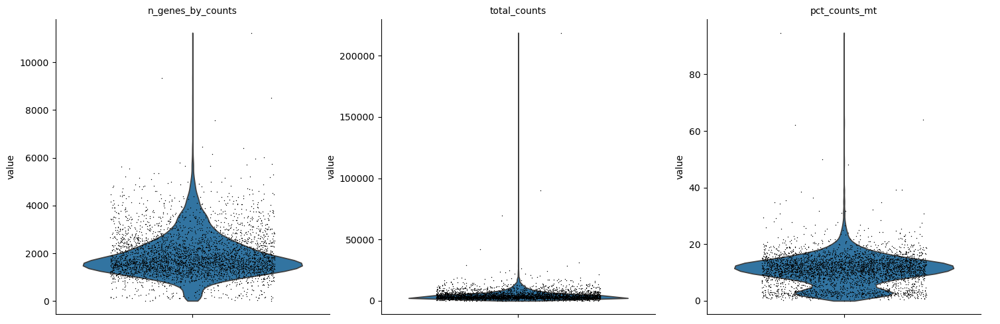

In [24]:
sc.pl.violin(mdatas[1].mod['rna'], ['n_genes_by_counts','total_counts','pct_counts_mt'], jitter=0.3, multi_panel=True)


### qc for atac seq

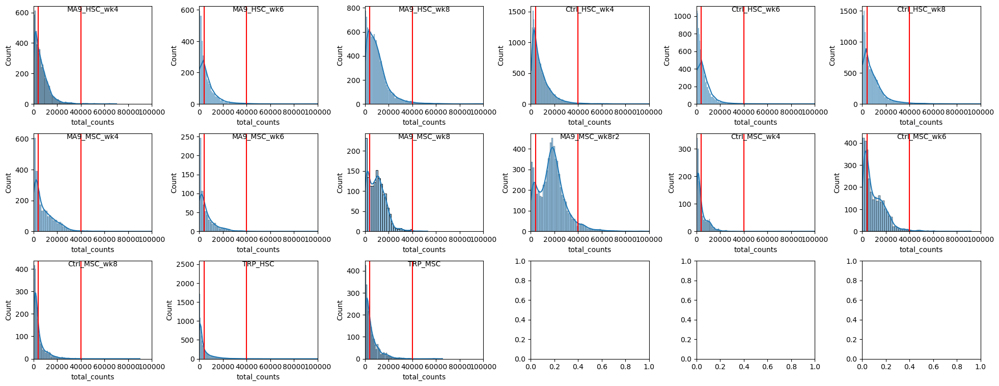

In [25]:
ncol = 6; nrow = 3; row_hight = 3; col_width = 4; wspace = 0.1; hspace = 0.4
fig, axes = plt.subplots(nrow , ncol, figsize=(ncol * col_width, nrow * row_hight) )
for ii, ax in enumerate(axes.flatten()):
    if ii == design.shape[0]:
        break
    else:
        ii_sample_name = design.loc[ii, 'sample_name']
        ii_title = design.loc[ii, 'sampleID']
        sns.histplot(mdatas[ii].mod['atac'].obs["total_counts"], kde=True, ax=ax)
        ax.set_xlim(0, 100000)
        xx = np.sum(ax.get_xlim()) / 2
        yy = np.max(ax.get_ylim())
        ax.text(x = xx, y = yy, s = ii_title, verticalalignment ='top', horizontalalignment ='center')
        ax.axvline(4000, color = 'red')
        ax.axvline(40000, color = 'red')
plt.subplots_adjust(hspace=0.3, wspace = .4)
plt.show()

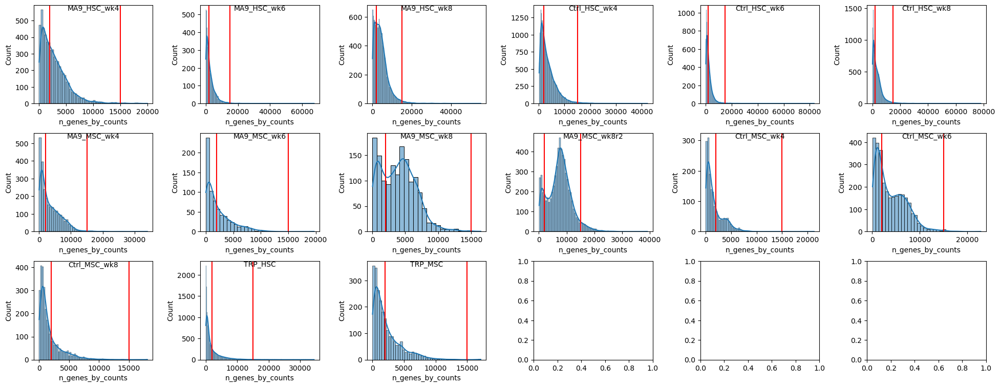

In [26]:
ncol = 6; nrow = 3; row_hight = 3; col_width = 4; wspace = 0.1; hspace = 0.4
fig, axes = plt.subplots(nrow , ncol, figsize=(ncol * col_width, nrow * row_hight) ) #ncol * figsize + (ncol - 1) * wspace * figsize, nrow * figsize + (nrow-1) * hspace * figsize) )
for ii, ax in enumerate(axes.flatten()):
    if ii == design.shape[0]:
        break
    else:
        ii_sample_name = design.loc[ii, 'sample_name']
        ii_title = design.loc[ii, 'sampleID']
        sns.histplot(mdatas[ii].mod['atac'].obs["n_genes_by_counts"], kde=True, ax=ax)
        #ax.set_xlim(0, 20000)
        xx = np.sum(ax.get_xlim()) / 2
        yy = np.max(ax.get_ylim())
        ax.text(x = xx, y = yy, s = ii_title, verticalalignment ='top', horizontalalignment ='center')
        ax.axvline(2000, color = 'red')
        ax.axvline(15000, color = 'red')
plt.subplots_adjust(hspace=0.3, wspace = .4)
plt.show()

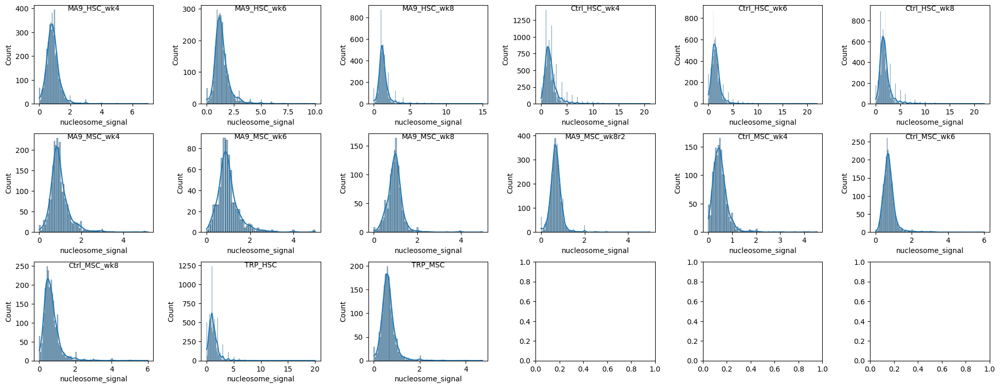

In [29]:
# Plot nucleosome signal distribution across cells
ncol = 6; nrow = 3; row_hight = 3; col_width = 4; wspace = 0.1; hspace = 0.4
fig, axes = plt.subplots(nrow , ncol, figsize=(ncol * col_width, nrow * row_hight) ) #ncol * figsize + (ncol - 1) * wspace * figsize, nrow * figsize + (nrow-1) * hspace * figsize) )
for ii, ax in enumerate(axes.flatten()):
    if ii == design.shape[0]:
        break
    else:
        atac = mdatas[ii].mod['atac']
        ii_sample_name = design.loc[ii, 'sample_name']
        ii_title = design.loc[ii, 'sampleID']
        #mu.pl.histogram(atac, "nucleosome_signal")
        sns.histplot(mdatas[ii].mod['atac'].obs["nucleosome_signal"], kde=True, ax=ax)
        #ax.set_xlim(0, 20000)
        xx = np.sum(ax.get_xlim()) / 2
        yy = np.max(ax.get_ylim())
        ax.text(x = xx, y = yy, s = ii_title, verticalalignment ='top', horizontalalignment ='center')
plt.subplots_adjust(hspace=0.3, wspace = .4)
plt.show()

## process rna seq 


In [ ]:
for mdata in mdatas:
    rna = mdata.mod['rna']
    mu.pp.filter_var(rna, 'n_cells_by_counts', lambda x: x >= 30)
    mu.pp.filter_obs(rna, 'n_genes_by_counts', lambda x: (x >= 200) & (x < 5000))
    mu.pp.filter_obs(rna, 'total_counts', lambda x: x < 15000)
    mu.pp.filter_obs(rna, 'pct_counts_mt', lambda x: x < 20)
    rna.layers['counts'] = rna.X.copy() # save the raw counts
    sc.pp.normalize_total(rna, target_sum=1e4)
    sc.pp.log1p(rna) 
    sc.pp.highly_variable_genes(rna, min_mean=0.02, max_mean=4, min_disp=0.5)
    sc.pp.scale(rna, max_value=10)
    sc.tl.pca(rna, svd_solver='arpack')
    sc.pp.neighbors(rna, n_neighbors=10, n_pcs=20)
    # Non-linear dimensionality reduction and clustering
    sc.tl.umap(rna, spread=1., min_dist=.5, random_state=11)
    sc.tl.leiden(rna, resolution=.5)


## processing atac seq


In [ ]:
for mdata in mdatas:
    atac = mdata.mod['atac']
    ac.pp.tfidf(atac, scale_factor=1e4)
    ac.tl.nucleosome_signal(atac, n=1e6)
    mu.pp.filter_var(atac, 'n_cells_by_counts', lambda x: x >= 10)
    mu.pp.filter_obs(atac, 'n_genes_by_counts', lambda x: (x >= 2000) & (x <= 15000))
    mu.pp.filter_obs(atac, 'total_counts', lambda x: (x >= 4000) & (x <= 40000))
    atac.layers['counts'] = atac.X.copy() # save the raw counts
    sc.pp.normalize_per_cell(atac, counts_per_cell_after=1e4)
    sc.pp.log1p(atac)
    sc.pp.highly_variable_genes(atac, min_mean=0.05, max_mean=1.5, min_disp=.5)
    sc.pp.scale(atac)
    sc.tl.pca(atac)
    sc.pp.neighbors(atac, n_neighbors=10, n_pcs=30)
    sc.tl.leiden(atac, resolution=.5)
    sc.tl.umap(atac, spread=1.5, min_dist=.5, random_state=20)
    ac.tl.rank_peaks_groups(atac, 'leiden', method='t-test')
    #mu.write("data/pbmc10k.h5mu/atac", atac)


In [ ]:
3

# QC atac after filter

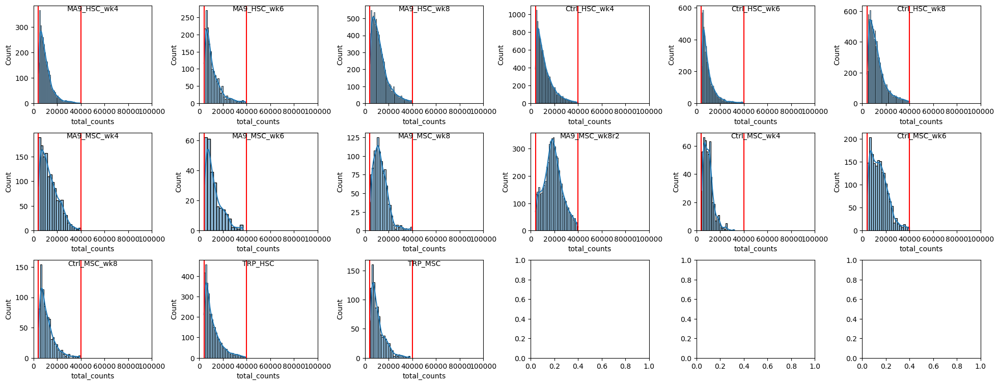

In [73]:
ncol = 6; nrow = 3; row_hight = 3; col_width = 4; wspace = 0.1; hspace = 0.4
fig, axes = plt.subplots(nrow , ncol, figsize=(ncol * col_width, nrow * row_hight) )
for ii, ax in enumerate(axes.flatten()):
    if ii == design.shape[0]:
        break
    else:
        ii_sample_name = design.loc[ii, 'sample_name']
        ii_title = design.loc[ii, 'sampleID']
        sns.histplot(mdatas[ii].mod['atac'].obs["total_counts"], kde=True, ax=ax)
        ax.set_xlim(0, 100000)
        xx = np.sum(ax.get_xlim()) / 2
        yy = np.max(ax.get_ylim())
        ax.text(x = xx, y = yy, s = ii_title, verticalalignment ='top', horizontalalignment ='center')
        ax.axvline(4000, color = 'red')
        ax.axvline(40000, color = 'red')
plt.subplots_adjust(hspace=0.3, wspace = .4)
plt.show()


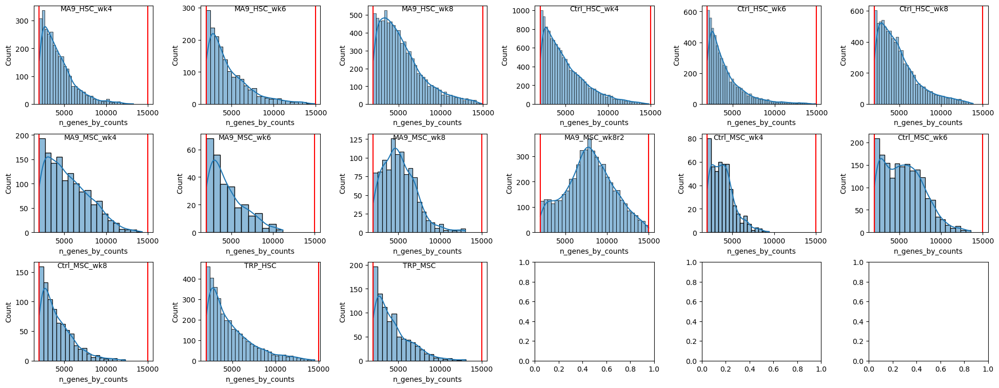

In [74]:
ncol = 6; nrow = 3; row_hight = 3; col_width = 4; wspace = 0.1; hspace = 0.4
fig, axes = plt.subplots(nrow , ncol, figsize=(ncol * col_width, nrow * row_hight) ) #ncol * figsize + (ncol - 1) * wspace * figsize, nrow * figsize + (nrow-1) * hspace * figsize) )
for ii, ax in enumerate(axes.flatten()):
    if ii == design.shape[0]:
        break
    else:
        ii_sample_name = design.loc[ii, 'sample_name']
        ii_title = design.loc[ii, 'sampleID']
        sns.histplot(mdatas[ii].mod['atac'].obs["n_genes_by_counts"], kde=True, ax=ax)
        #ax.set_xlim(0, 20000)
        xx = np.sum(ax.get_xlim()) / 2
        yy = np.max(ax.get_ylim())
        ax.text(x = xx, y = yy, s = ii_title, verticalalignment ='top', horizontalalignment ='center')
        ax.axvline(2000, color = 'red')
        ax.axvline(15000, color = 'red')
plt.subplots_adjust(hspace=0.3, wspace = .4)
plt.show()


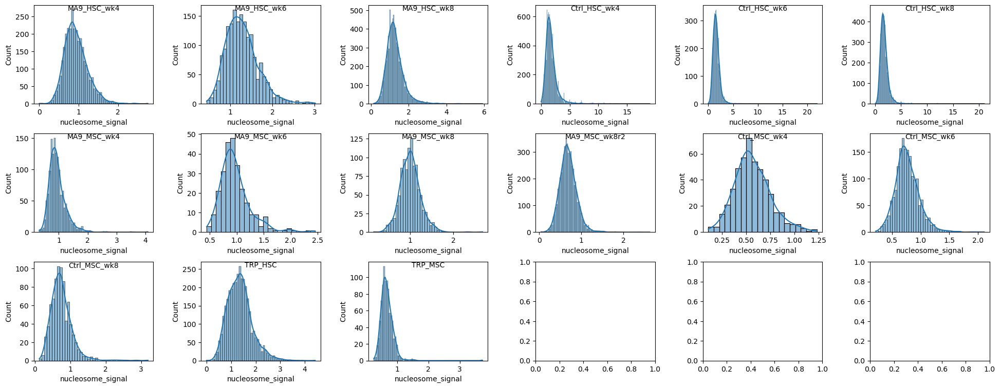

In [34]:
# Plot nucleosome signal distribution across cells
ncol = 6; nrow = 3; row_hight = 3; col_width = 4; wspace = 0.1; hspace = 0.4
fig, axes = plt.subplots(nrow , ncol, figsize=(ncol * col_width, nrow * row_hight) ) #ncol * figsize + (ncol - 1) * wspace * figsize, nrow * figsize + (nrow-1) * hspace * figsize) )
for ii, ax in enumerate(axes.flatten()):
    if ii == design.shape[0]:
        break
    else:
        atac = mdatas[ii].mod['atac']
        ii_sample_name = design.loc[ii, 'sample_name']
        ii_title = design.loc[ii, 'sampleID']
        sns.histplot(mdatas[ii].mod['atac'].obs["nucleosome_signal"], kde=True, ax=ax)
        xx = np.sum(ax.get_xlim()) / 2
        yy = np.max(ax.get_ylim())
        ax.text(x = xx, y = yy, s = ii_title, verticalalignment ='top', horizontalalignment ='center')
plt.subplots_adjust(hspace=0.3, wspace = .4)
plt.show()


In [35]:
mdatas[1]

MuData object with n_obs × n_vars = 3883 × 112724
  var:	'gene_ids', 'feature_types', 'genome', 'interval'
  2 modalities
    rna:	3665 x 11808
      obs:	'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'leiden'
      var:	'gene_ids', 'feature_types', 'genome', 'interval', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
      uns:	'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden'
      obsm:	'X_pca', 'X_umap'
      varm:	'PCs'
      layers:	'counts'
      obsp:	'distances', 'connectivities'
    atac:	1728 x 79454
      obs:	'n_genes_by_counts', 'total_counts', 'nucleosome_signal', 'n_counts', 'leiden'
      var:	'gene_ids', 'feature_types', 'genome', 'interval', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
      uns:	'atac', 'files', 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'umap', 'rank_genes_groups'
      obsm:	'X_pca', 'X_umap'
      varm:	'PCs'
      layers:	'counts'
      obsp:	'distances', 'connectivities'

# export data 

In [ ]:
rows, cols = design.shape
for ii in np.arange(rows):
    mdata = mdatas[ii]
    h5file_save = design.loc[design.index[ii], 'h5file_save']
    mdata.write(h5file_save)
    # export RNASeq and ATACSeq model separately
    # h5file_save = design.loc[design.index[ii], 'h5file_rna_save']
    # mdata.mod['rna'].write(h5file_save)
    # h5file_save = design.loc[design.index[ii], 'h5file_atac_save']
    # mdata.mod['atac'].write(h5file_save)

In [72]:
# for re-analysis, import data back 
mdatas = [mu.read(fname) for fname in design['h5file_save'] ]


In [11]:
mdata = mu.read_10x_h5('/research/groups/jxugrp/home/common/Lab_Members/JinWang/cluster/multiome_merge/iMLLAF9_arc_out/H2_out/outs/filtered_feature_bc_matrix.h5')
mdata.var_names_make_unique() 


Added `interval` annotation for features from /research/groups/jxugrp/home/common/Lab_Members/JinWang/cluster/multiome_merge/iMLLAF9_arc_out/H2_out/outs/filtered_feature_bc_matrix.h5
Added peak annotation from /research/groups/jxugrp/home/common/Lab_Members/JinWang/cluster/multiome_merge/iMLLAF9_arc_out/H2_out/outs/atac_peak_annotation.tsv to .uns['atac']['peak_annotation']
Added gene names to peak annotation in .uns['atac']['peak_annotation']
Located fragments file: /research/groups/jxugrp/home/common/Lab_Members/JinWang/cluster/multiome_merge/iMLLAF9_arc_out/H2_out/outs/atac_fragments.tsv.gz
pysam is not available. It is required to work with the fragments file.                 Install pysam from PyPI (`pip install pysam`)                 or from GitHub (`pip install git+https://github.com/pysam-developers/pysam`)


In [ ]:
# https://muon.readthedocs.io/en/latest/omics/multi.html
mu.tl.mofa(mdata, use_obs='union', gpu_mode=True) 
mu.tl.leiden(mdata, resolution=[2., .5])
mu.pp.neighbors(mdata)
mu.tl.umap(mdata)


# plot test for the above rna and atac analysis

In [11]:
# if needed to load data
mdatas = [mu.read(fname) for fname in design['h5file_save'] ]

... storing 'feature_types' as categorical
... storing 'genome' as categorical
... storing 'interval' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical
... storing 'interval' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical
... storing 'interval' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical
... storing 'interval' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical
... storing 'interval' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical
... storing 'interval' as categorical


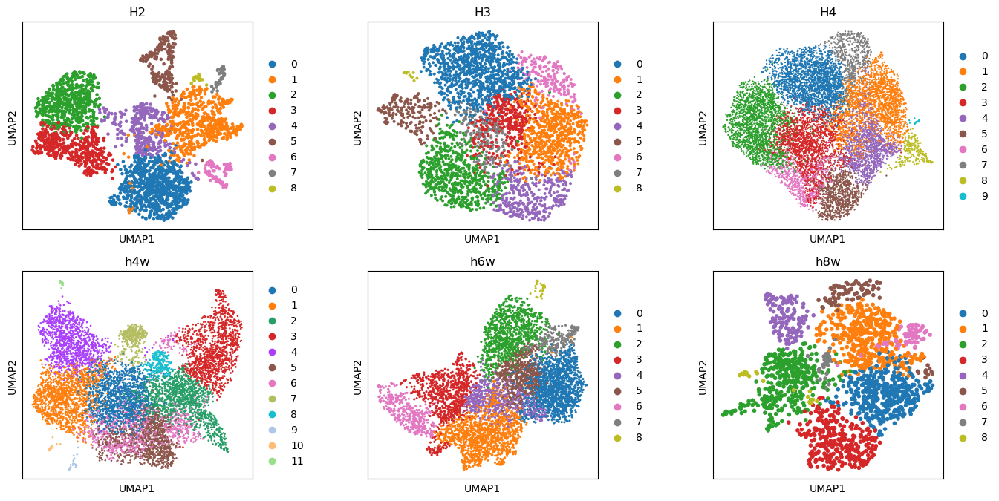

In [120]:
# plot clusters
ncols = 3
nrows = 2
figsize = 4
wspace = 0.5
fig, axs = plt.subplots(
    nrows=nrows,
    ncols=ncols,
    figsize=(ncols * figsize + figsize * wspace * (ncols - 1), nrows * figsize),
)
plt.subplots_adjust(wspace=wspace)

ii = 0 
for rr in np.arange(nrows):
    for cc in np.arange(ncols):
        jj = tmp.index[ii]
        mdata = mdatas[int(jj)-1]
        rna = mdata.mod['rna']
        sc.pl.umap(rna, color="leiden", show = False, ax = axs[rr, cc], title = tmp.loc[jj, 'sname']) 
        ii = ii + 1
        if ii == tmp.shape[0]:
            break


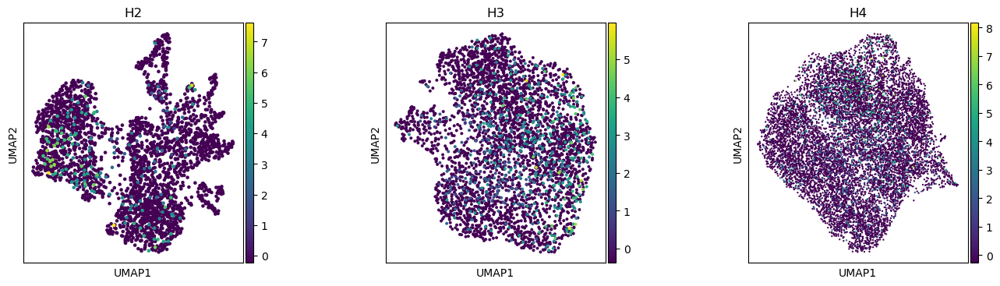

In [126]:
# plot knockin gene expression
ncols = 3
figsize = 4
wspace = 0.5
fig, axs = plt.subplots(
    nrows=nrows,
    ncols=ncols,
    figsize=(ncols * figsize + figsize * wspace * (ncols - 1), nrows * figsize),
)
plt.subplots_adjust(wspace=wspace)

ii = 0 
for cc in np.arange(ncols):
    jj = tmp.index[ii]
    mdata = mdatas[int(jj)-1]
    rna = mdata.mod['rna']
    sc.pl.umap(rna, color="hNGFR", show = False, ax = axs[cc], title = tmp.loc[jj, 'sname']) 
    ii = ii + 1
    if ii == tmp.shape[0]:
        break


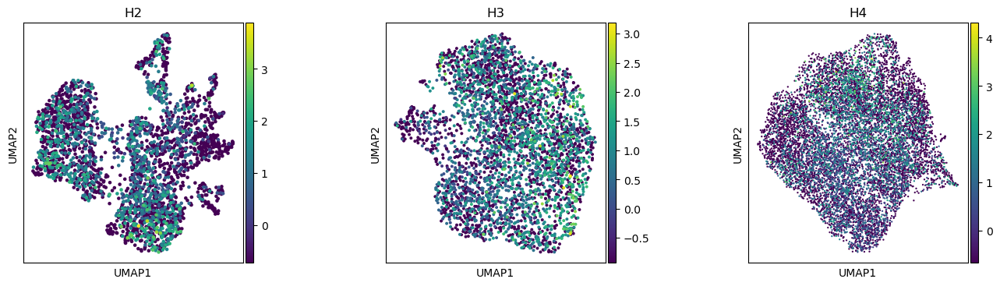

In [127]:
# check oncogene expression
ncols = 3
figsize = 4
wspace = 0.5
fig, axs = plt.subplots(
    nrows=nrows,
    ncols=ncols,
    figsize=(ncols * figsize + figsize * wspace * (ncols - 1), nrows * figsize),
)
plt.subplots_adjust(wspace=wspace)

ii = 0 
for cc in np.arange(ncols):
    jj = tmp.index[ii]
    mdata = mdatas[int(jj)-1]
    rna = mdata.mod['rna']
    sc.pl.umap(rna, color="MLL-AF9", show = False, ax = axs[cc], title = tmp.loc[jj, 'sname']) 
    ii = ii + 1
    if ii == tmp.shape[0]:
        break


(2779, 11740)


<Axes: >

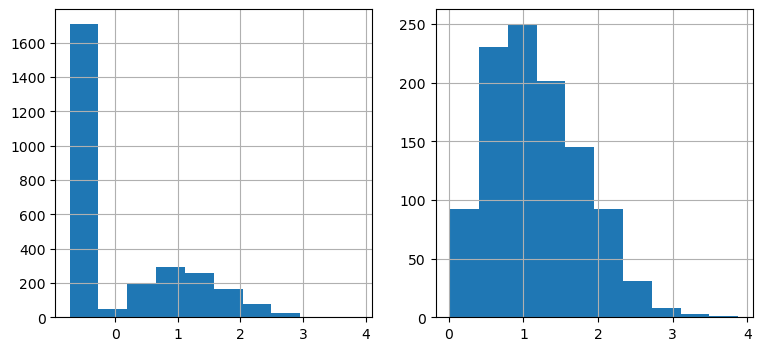

In [168]:
# oncogene expression distribution
tmp = mdatas[0].mod['rna'].to_df()
print(tmp.shape)
tmp.loc[tmp['MLL-AF9'] > 0, 'MLL-AF9']
fig, axes = plt.subplots(1, 2, figsize = (9,4))
tmp.loc[:, 'MLL-AF9'].hist(ax = axes[0])
tmp.loc[tmp['MLL-AF9'] > 0, 'MLL-AF9'].hist(ax = axes[1])


(2779, 11740)


<Axes: >

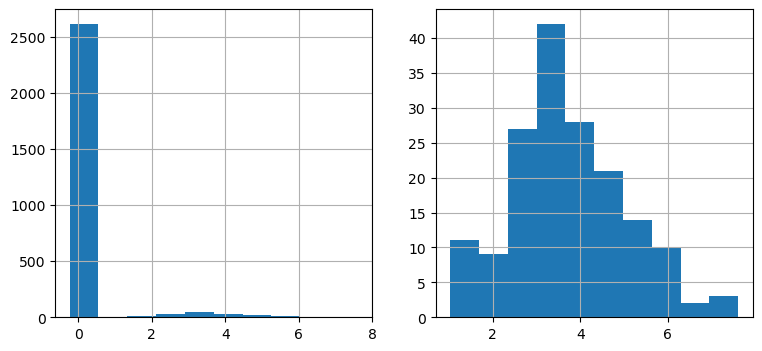

In [167]:
# marker gene expression distribution 
tmp = mdatas[0].mod['rna'].to_df()
print(tmp.shape)
tmp.loc[tmp['hNGFR'] > 0, 'hNGFR']
fig, axes = plt.subplots(1, 2, figsize = (9,4))
tmp.loc[:, 'hNGFR'].hist(ax = axes[0])
tmp.loc[tmp['hNGFR'] > 0, 'hNGFR'].hist(ax = axes[1])


# cell type annotation using celltypist for WT and MLL-AF9 cells


- The challenge is to distinguish MLL-AF9 positive cells from normal hematopoietic cells within the same animal. However, single-cell gene expression data alone does not provide a clear solution.
- One approach tested here is training a CellTypist model using MLL-AF9+ cells from transplanted animals as true positives and wild-type control cells as true negatives. This model is then used to predict other cells, based on the idea that some MLL-AF9+ cells may not exhibit detectable expression of the fusion gene.
- Another approach uses hNGFR+ cells as true positive markers.
- Since multiple time points were collected after transplantation, reflecting different stages of disease development, separate models were trained for different time points.


## H2 vs h4w WT MA based on own data


In [794]:
# 4 week MA9+ w/ 4 week control

# MA model sample
hh = mdatas[0].mod['rna'].copy()
hh.obs['MLL-AF9'] = hh.to_df()['MLL-AF9']
mu.pp.filter_obs(hh, 'MLL-AF9', lambda x: (x >0))

# wild control sample
ww = mdatas[8].mod['rna'].copy()
hh.obs['genotype'] = 'MA9'
ww.obs['genotype'] = 'WT'

# combine expression data
hhww = hh.concatenate(ww)
hhww.X = hhww.layers['counts']
sc.pp.normalize_total(hhww, target_sum=1e4)
sc.pp.log1p(hhww)

# train celltypist model
hhww_ma9_wt_model = celltypist.train(hhww, labels = 'genotype', n_jobs = 10, feature_selection = True, use_SGD = True)

# save model 
hhww_ma9_wt_model.write('data2/h4w4_ma9_wt_model.pkl')


🍳 Preparing data before training
🔬 Input data has 9443 cells and 11571 genes
⚖️ Scaling input data
🏋️ Training data using SGD logistic regression
🔎 Selecting features
🧬 300 features are selected
🏋️ Starting the second round of training
🏋️ Training data using SGD logistic regression
✅ Model training done!


## H3 vs h6w WT MA based on own data


In [878]:
hh = mdatas[1].mod['rna'].copy()
hh.obs['hNGFR'] = hh.to_df()['hNGFR']
mu.pp.filter_obs(hh, 'hNGFR', lambda x: (x >0.6))
hh.obs['MLL-AF9'] = hh.to_df()['MLL-AF9']
mu.pp.filter_obs(hh, 'MLL-AF9', lambda x: (x >1))

ww = mdatas[9].mod['rna'].copy()
hh.obs['genotype'] = 'MA9'
ww.obs['genotype'] = 'WT'

hhww = hh.concatenate(ww)
hhww.X = hhww.layers['counts']
sc.pp.normalize_total(hhww, target_sum=1e4)
sc.pp.log1p(hhww)
hhww_ma9_wt_model = celltypist.train(hhww, labels = 'genotype', n_jobs = 10, feature_selection = True)

# 6 week MA9+ w/ 6 week control
#np.savetxt('data2/h6w6_ma9_wt_model_features', ma9_wt_model.features, delimiter = '\t', fmt='%s')
hhww_ma9_wt_model.write('data2/h6w6_ngfr_ma9_wt_model.pkl')


🍳 Preparing data before training
🔬 Input data has 6384 cells and 11565 genes
⚖️ Scaling input data
🏋️ Training data using SGD logistic regression
🔎 Selecting features
🧬 300 features are selected
🏋️ Starting the second round of training
🏋️ Training data using logistic regression
✅ Model training done!


## H4 vs h8w WT MA based on own data


In [891]:
hh = mdatas[2].mod['rna'].copy()
hh.obs['hNGFR'] = hh.to_df()['hNGFR']
mu.pp.filter_obs(hh, 'hNGFR', lambda x: (x >0.6))
hh.obs['MLL-AF9'] = hh.to_df()['MLL-AF9']
mu.pp.filter_obs(hh, 'MLL-AF9', lambda x: (x >1))

ww = mdatas[10].mod['rna'].copy()
hh.obs['genotype'] = 'MA9'
ww.obs['genotype'] = 'WT'

hhww = hh.concatenate(ww)
hhww.X = hhww.layers['counts']
sc.pp.normalize_total(hhww, target_sum=1e4)
sc.pp.log1p(hhww)
hhww_ma9_wt_model = celltypist.train(hhww, labels = 'genotype', n_jobs = 10, feature_selection = True)

# 6 week MA9+ w/ 6 week control
# np.savetxt('data2/h8w8_ma9_wt_model_features', hhww_ma9_wt_model.features, delimiter = '\t', fmt='%s')
hhww_ma9_wt_model.write('data2/h8w8_ngfr_ma9_wt_model.pkl')


🍳 Preparing data before training
✂️ 1 non-expressed genes are filtered out
🔬 Input data has 2327 cells and 11877 genes
⚖️ Scaling input data
🏋️ Training data using SGD logistic regression
🔎 Selecting features
🧬 300 features are selected
🏋️ Starting the second round of training
🏋️ Training data using logistic regression
✅ Model training done!


## hNGFR positive cells from 3 samples as positive cells


In [856]:
h1 = mdatas[0].mod['rna'].copy()
h1.obs['hNGFR'] = h1.to_df()['hNGFR']
mu.pp.filter_obs(h1, 'hNGFR', lambda x: (x >0))
h1.obs['MLL-AF9'] = h1.to_df()['MLL-AF9']
mu.pp.filter_obs(h1, 'MLL-AF9', lambda x: (x >0))
h1.obs['genotype'] = 'MA9'

h2 = mdatas[1].mod['rna'].copy()
h2.obs['hNGFR'] = h2.to_df()['hNGFR']
mu.pp.filter_obs(h2, 'hNGFR', lambda x: (x >0))
h2.obs['MLL-AF9'] = h2.to_df()['MLL-AF9']
mu.pp.filter_obs(h2, 'MLL-AF9', lambda x: (x >0))
h2.obs['genotype'] = 'MA9'

h3 = mdatas[2].mod['rna'].copy()
h3.obs['hNGFR'] = h3.to_df()['hNGFR']
mu.pp.filter_obs(h3, 'hNGFR', lambda x: (x >0))
h3.obs['MLL-AF9'] = h3.to_df()['MLL-AF9']
mu.pp.filter_obs(h3, 'MLL-AF9', lambda x: (x >0))
h3.obs['genotype'] = 'MA9'

w1 = mdatas[8].mod['rna'].copy()
w2 = mdatas[9].mod['rna'].copy()
w3 = mdatas[10].mod['rna'].copy()
w1.obs['genotype'] = 'WT'
w2.obs['genotype'] = 'WT'
w3.obs['genotype'] = 'WT'

hhww = h1.concatenate([h2, h3, w1, w2, w3])

hhww.X = hhww.layers['counts'].copy()
sc.pp.normalize_total(hhww, target_sum=1e4)
sc.pp.log1p(hhww)
hhww_ngfr_wt_model = celltypist.train(hhww, labels = 'genotype', n_jobs = 10, feature_selection = True, use_SGD = True)
hhww_ngfr_wt_model.write('data2/hhww_ngfr_wt_model.pkl')


🍳 Preparing data before training
🔬 Input data has 17350 cells and 10797 genes
⚖️ Scaling input data
🏋️ Training data using SGD logistic regression
🔎 Selecting features
🧬 300 features are selected
🏋️ Starting the second round of training
🏋️ Training data using SGD logistic regression
✅ Model training done!


## based on GSE81682 for stem cell and progenitor

In [172]:
%%R
# create another model for HSC and progenitor 
options(width = 333)
mtx = fread('data/GSE81682_HTSeq_counts.txt', sep = '\t')
geneid = fread('data/mmu_ensg_symbol') 
setkey(geneid, 'ensg')
mtx$ID = geneid[mtx$ID, symbol]
mtx2 = mtx[!is.na(mtx$ID) & !duplicated(mtx$ID), ]
mtx3 = data.frame(mtx2[, 2:ncol(mtx2)], row.names = mtx2$ID)
mtx4 = t(mtx3)
write.table(mtx4, file = 'data/GSE81682_cleaned.tsv', sep = '\t') 
mtx4[1:10, 1:10]


           Gnai3 Pbsn Cdc45 H19 Scml2 Apoh Narf Cav2 Klf6 Scmh1
HSPC_007       0    0     4   0     0    0    1    1    0     2
HSPC_013       7    0     1   0     0    0    1    0   18     1
HSPC_019       1    0     2   0     0    0    2    0    3     2
HSPC_025     185    0     4   0     0    0    1    0    9     0
HSPC_031       2    0     3   0     0    0    2    0   51     0
HSPC_037       2    0     1   0     0    0    3    0    3   153
LT.HSC_001   136    0     1   0     0    0    0    0   46     0
HSPC_001     232    0     2   0     0    0    0    0   56     0
HSPC_008     354    0     2   0     1    0    0  242    1     0
HSPC_014     181    0     0   0    20    0    0    1  364    59


In [173]:
%%R
obs = data.frame(cell_type = sub('_.*', '', colnames(mtx3)), row.names = colnames(mtx3))
write.table(obs, file = 'data/GSE81682_cleaned_obs.tsv', sep = '\t' ) 
head(obs)


         cell_type
HSPC_007      HSPC
HSPC_013      HSPC
HSPC_019      HSPC
HSPC_025      HSPC
HSPC_031      HSPC
HSPC_037      HSPC


In [174]:
mtx = pd.read_csv('data/GSE81682_cleaned.tsv', sep = '\t')
gse81682 = sc.AnnData(mtx)
celltype = pd.read_csv('data/GSE81682_cleaned_obs.tsv', sep = '\t')
gse81682.obs['cell_type'] = celltype['cell_type']
sc.pp.normalize_total(gse81682, target_sum=1e4)
sc.pp.log1p(gse81682) 
gse81682_model = celltypist.train(gse81682, labels = 'cell_type', n_jobs = 10, feature_selection = True)
gse81682_model.write('data/gse81682_cell_type.pkl')

np.savetxt('data/gse81682_model_features', gse81682_model.features, delimiter = '\t', fmt = '%s')


🍳 Preparing data before training
✂️ 2412 non-expressed genes are filtered out
🔬 Input data has 1920 cells and 42811 genes
⚖️ Scaling input data
🏋️ Training data using SGD logistic regression
🔎 Selecting features
🧬 841 features are selected
🏋️ Starting the second round of training
🏋️ Training data using logistic regression
✅ Model training done!


## based on GSE121768 day 1 induced MA9

In [131]:
%%R
tmp = fread('/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/scRNA_seq/GSE121768/GSE121768_scRNA_all_samples_expression_data.csv')
colnames(tmp)  = sub(' .*', '', colnames(tmp))
print(dim(tmp))
tmp2 = tmp[, !duplicated(colnames(tmp)), with = F]
fwrite(tmp2, file = 'data/gse121768.tsv', sep = ',')
dim(tmp2)


[1]  6237 27999
[1]  6237 27934


In [132]:
# train celltypist model using GSE121768, day 1 dox induced MA9 in GMP
# genes by column, cells by row
mtx = pd.read_csv('data/gse121768.tsv', sep = ',', header=0, index_col=0)
gse121768 = sc.AnnData(mtx)


In [134]:
dsn_gse121768 = pd.DataFrame(mtx.index.astype(str))
new_columns = dsn_gse121768['Barcode'].str.split('_', expand = True).rename(columns = {0:'cell_index', 1:'day', 2:'cell_type', 3:'genotype', 4:'nothing'})
dsn_gse121768 = pd.concat([dsn_gse121768, new_columns], axis = 1)


In [136]:
dsn_gse121768[['cell_type', 'day']].value_counts()


cell_type  day
GMP        D0     2610
Ctrl       D1     2007
Dox        D1     1620
dtype: int64

In [137]:
gse121768.obs = dsn_gse121768

In [138]:
mask = gse121768.obs["cell_type"].apply(lambda s: bool(set(['Ctrl', 'Dox']) & set(s)))


In [139]:
mask = gse121768.obs["cell_type"].apply(lambda s: s in ['Ctrl', 'Dox']) 
gse121768_sel = gse121768[mask, :]


In [141]:
gse121768_sel

View of AnnData object with n_obs × n_vars = 3627 × 27933
    obs: 'Barcode', 'cell_index', 'day', 'cell_type', 'genotype', 'nothing'

In [142]:
sc.pp.normalize_total(gse121768_sel, target_sum=1e4)
sc.pp.log1p(gse121768_sel) 

gse121768_model = celltypist.train(gse121768_sel, labels = 'cell_type', n_jobs = 10, feature_selection = True)
gse121768_model.write('data/gse121768_model_cell_type.pkl')

np.savetxt('data/gse121768_model_features', gse121768_model.features, delimiter = '\t', fmt = '%s')


🍳 Preparing data before training
✂️ 12361 non-expressed genes are filtered out
🔬 Input data has 3627 cells and 15572 genes
⚖️ Scaling input data
🏋️ Training data using SGD logistic regression
🔎 Selecting features
🧬 300 features are selected
🏋️ Starting the second round of training
🏋️ Training data using logistic regression
✅ Model training done!


## annotate cell type

In [32]:
# this step is only for removing the annotation information for re-annotation
ann_cols = [ 'oldway_predicted_labels',  'oldway_over_clustering',  'oldway_majority_voting',  'oldway_conf_score',
            'ngfr_predicted_labels',  'ngfr_over_clustering',  'ngfr_majority_voting',  'ngfr_conf_score',
            'wk4_predicted_labels',  'wk4_over_clustering',  'wk4_majority_voting',  'wk4_conf_score',
            'wk6_predicted_labels',  'wk6_over_clustering',  'wk6_majority_voting',  'wk6_conf_score',
            'wk8_predicted_labels',  'wk8_over_clustering',  'wk8_majority_voting',  'wk8_conf_score',
            'dp_predicted_labels',  'dp_over_clustering',  'dp_majority_voting',  'dp_conf_score',
            'hspc_predicted_labels',  'hspc_over_clustering',  'hspc_majority_voting',  'hspc_conf_score',
            'celltype_predicted_labels', 'celltype_over_clustering',  'celltype_majority_voting', 'celltype_conf_score',
            'celtype_d1_predicted_labels', 'celtype_d1_over_clustering', 'celtype_d1_majority_voting', 'celtype_d1_conf_score',
            'celltype_d1_predicted_labels', 'celltype_d1_over_clustering', 'celltype_d1_majority_voting', 'celltype_d1_conf_score',
            'hNFGR_predicted_labels', 'hNFGR_over_clustering', 'hNFGR_majority_voting', 'hNFGR_conf_score']

rows, cols = design.shape
for ii in np.arange(rows):
    print(ii)
    mdata = mdatas[ii] 
    rna = mdata.mod['rna']
    df = rna.obs
    ann_cols_ov = [ii for ii in df.columns.astype(str) if ii in ann_cols ]
    for ann_col in ann_cols_ov:
        df.drop(ann_col, axis=1, inplace=True)
    rna.obs = df
    

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14


In [ ]:
# annotate all the sample with MA9/wt model, HSC and Progenitor model, GSE121768 model
rows, cols = design.shape
for ii in np.arange(rows):
    mdata = mdatas[ii]
    rna = mdata.mod['rna']
    rna.X = rna.layers['counts'].copy()
    sc.pp.normalize_total(rna, target_sum=1e4)
    sc.pp.log1p(rna) 

    # predict cell type based on all NGFR+ cells
    rna_predict = celltypist.annotate(rna, model = 'data2/hhww_ngfr_wt_model.pkl', majority_voting = True)
    rna = rna_predict.to_adata()
    rna.obs = rna.obs.rename(columns={'predicted_labels': 'ngfr_predicted_labels', 'over_clustering': 'ngfr_over_clustering', 'majority_voting': 'ngfr_majority_voting', 'conf_score': 'ngfr_conf_score'})
    
    # predict cell type based 4 week
    rna_predict = celltypist.annotate(rna, model = 'data2/h4w4_ngfr_ma9_wt_model.pkl', majority_voting = True)
    rna = rna_predict.to_adata()
    rna.obs = rna.obs.rename(columns={'predicted_labels': 'wk4_predicted_labels', 'over_clustering': 'wk4_over_clustering', 'majority_voting': 'wk4_majority_voting', 'conf_score': 'wk4_conf_score'})
    # predict cell type based 6 week
    rna_predict = celltypist.annotate(rna, model = 'data2/h6w6_ngfr_ma9_wt_model.pkl', majority_voting = True)
    rna = rna_predict.to_adata()
    rna.obs = rna.obs.rename(columns={'predicted_labels': 'wk6_predicted_labels', 'over_clustering': 'wk6_over_clustering', 'majority_voting': 'wk6_majority_voting', 'conf_score': 'wk6_conf_score'})
    # predict cell type based 8 week
    rna_predict = celltypist.annotate(rna, model = 'data2/h8w8_ngfr_ma9_wt_model.pkl', majority_voting = True)
    rna = rna_predict.to_adata()
    rna.obs = rna.obs.rename(columns={'predicted_labels': 'wk8_predicted_labels', 'over_clustering': 'wk8_over_clustering', 'majority_voting': 'wk8_majority_voting', 'conf_score': 'wk8_conf_score'})
    
    # predict cell type based on H4 vs WT model, with all cells
    rna_predict = celltypist.annotate(rna, model = 'data/ma9_wt_model.pkl', majority_voting = True)
    rna = rna_predict.to_adata()
    rna.obs = rna.obs.rename(columns={'predicted_labels': 'oldway_predicted_labels', 'over_clustering': 'oldway_over_clustering', 'majority_voting': 'oldway_majority_voting', 'conf_score': 'oldway_conf_score'})
    # predict based on H4 vs WT model, based on both hNGFR+ and MA9+ cells in H4
    rna_predict = celltypist.annotate(rna, model = 'data2/ma9_wt_model.pkl', majority_voting = True)
    rna = rna_predict.to_adata()
    rna.obs = rna.obs.rename(columns={'predicted_labels': 'dp_predicted_labels', 'over_clustering': 'dp_over_clustering', 'majority_voting': 'dp_majority_voting', 'conf_score': 'dp_conf_score'})
    # predict cell type based on HSC / progenitor
    rna_predict = celltypist.annotate(rna, model = 'data/gse81682_cell_type.pkl', majority_voting = True)
    rna = rna_predict.to_adata()
    rna.obs = rna.obs.rename(columns={'predicted_labels': 'hspc_predicted_labels', 'over_clustering': 'hspc_over_clustering', 'majority_voting': 'hspc_majority_voting', 'conf_score': 'hspc_conf_score'})
    # predict based on GSE121768, early MA induction
    rna_predict = celltypist.annotate(rna, model = 'data/gse121768_model_cell_type.pkl', majority_voting = True)
    rna = rna_predict.to_adata()
    rna.obs = rna.obs.rename(columns={'predicted_labels': 'celltype_d1_predicted_labels', 'over_clustering': 'celltype_d1_over_clustering', 'majority_voting': 'celltype_d1_majority_voting', 'conf_score': 'celltype_d1_conf_score'})
    # predict based on the hNFGR model
    rna_predict = celltypist.annotate(rna, model = 'data/hNFGR_model.pkl', majority_voting = True)
    rna = rna_predict.to_adata()
    rna.obs = rna.obs.rename(columns={'predicted_labels': 'hNFGR_predicted_labels', 'over_clustering': 'hNFGR_over_clustering', 'majority_voting': 'hNFGR_majority_voting', 'conf_score': 'hNFGR_conf_score'})


In [35]:
# Calculate how well marker or oncogene-positive cells were predicted as positive cells
ii = 1
lbl = 'wk4_majority_voting'
lbl = 'ngfr_predicted_labels'
hh = mdatas[ii].mod['rna'].obs
mm = mdatas[ii].mod['rna'].to_df()
print('total ma9+ rate in sample is ', hh.loc[hh[lbl] == 'MA9', :].shape[0] / hh.shape[0])

test = mm.loc[mm['hNGFR'] > 0, :] 
test = hh.loc[test.index, ]

print('hNGFR positive cells :', test.shape[0])

print('hNGFR positive cells annotted as MA9:', test.loc[test[lbl] == 'MA9', :].shape[0] / test.shape[0])

test = mm.loc[mm['MLL-AF9'] > 0, :] 
test = hh.loc[test.index, ]

print('MLL-AF9 positive cells :', test.shape[0])

test = mm.loc[mm['MLL-AF9'] > 0, :] 
test = hh.loc[test.index, ]
print('MLL-AF9 positive cells annotted as MA9:', test.loc[test[lbl] == 'MA9', :].shape[0] / test.shape[0]) 

test = mm.loc[mm['MLL-AF9'] > 0, :].loc[mm['hNGFR'] > 0, :] 
test = hh.loc[test.index, ]
print('double positive cells ', test.shape[0])
print('double positive cells annotted as MA9:', test.loc[test[lbl] == 'MA9', :].shape[0] / test.shape[0] )


total ma9+ rate in sample is  0.8897680763983629
hNGFR positive cells : 511
hNGFR positive cells annotted as MA9: 0.9823874755381604
MLL-AF9 positive cells : 1905
MLL-AF9 positive cells annotted as MA9: 0.9254593175853019
double positive cells  395
double positive cells annotted as MA9: 0.9924050632911392


## revise annotation using conf score cutoff

In [ ]:
ob = mdatas[0].mod['rna'].obs.copy()
mm = mdatas[0].mod['rna'].to_df().copy()
ob.loc[ob['wk4_conf_score'] < 0.9999, 'wk4_predicted_labels'] = 'WT'
print(ob['wk4_predicted_labels'].value_counts())
ob['wk4_predicted_labels'].value_counts().loc['MA9', ] / ob.shape[0]


In [ ]:
ob = mdatas[0].mod['rna'].obs
mm = mdatas[0].mod['rna'].to_df()
ob.loc[ob['wk4_conf_score'] < 0.9999, 'wk4_predicted_labels'] = 'WT'
print(ob['wk4_predicted_labels'].value_counts())
ob['wk4_predicted_labels'].value_counts().loc['MA9', ] / ob.shape[0]


In [973]:
ob = mdatas[1].mod['rna'].obs.copy()
mm = mdatas[1].mod['rna'].to_df().copy()
ob.loc[ob['wk6_conf_score'] < 0.9999, 'wk6_predicted_labels'] = 'WT'
print(ob['wk6_predicted_labels'].value_counts())
ob['wk6_predicted_labels'].value_counts().loc['MA9', ] / ob.shape[0]


MA9    2423
WT     1242
Name: wk6_predicted_labels, dtype: int64


0.661118690313779

In [974]:
ob = mdatas[2].mod['rna'].obs.copy()
mm = mdatas[2].mod['rna'].to_df().copy()
ob.loc[ob['wk8_conf_score'] < .9995, 'wk8_predicted_labels'] = 'WT'
print(ob['wk8_predicted_labels'].value_counts())
ob['wk8_predicted_labels'].value_counts().loc['MA9', ] / ob.shape[0]


MA9    8168
WT     2618
Name: wk8_predicted_labels, dtype: int64


0.7572779529019099

In [944]:
ob.shape

(3665, 47)

In [702]:
# wk6_predicted_labels wk6_majority_voting
ii = 1
mdatas[ii].mod['rna'].obs.loc[mdatas[ii].mod['rna'].obs['wk6_predicted_labels'] == 'MA9', ].shape[0] / mdatas[ii].mod['rna'].obs.shape[0]


0.9699863574351978

In [703]:
# hNFGR + cell predicted by the old way 
xx = mdatas[ii].mod['rna'].obs
nm = mdatas[ii].mod['rna'].to_df()
nm_2 = nm.loc[nm['hNGFR'] > 0, ]
nm_2.loc[xx['wk6_predicted_labels'] == 'MA9', ].shape[0] / nm_2.shape[0]


1.0

## plot cell type annotation

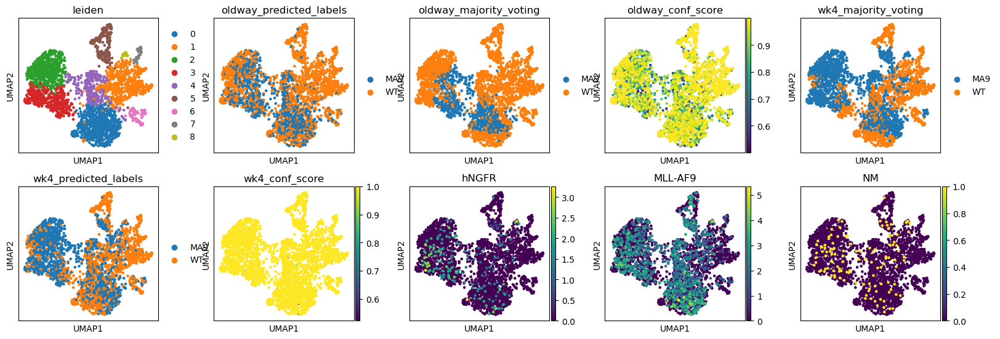

In [765]:
rna_h2 = mdatas[0].mod['rna'].copy()

nm = (rna_h2.to_df()['hNGFR'] > 0).values & (rna_h2.to_df()['MLL-AF9'] > 0).values 
rna_h2.obs['NM'] = nm + 0
rna_h2.var['MLL-AF9'] = rna_h2.to_df()['MLL-AF9']
sc.pl.umap(rna_h2, color = ['leiden', 'oldway_predicted_labels', 'oldway_majority_voting', 'oldway_conf_score', 'wk4_majority_voting', 'wk4_predicted_labels', 'wk4_conf_score', 'hNGFR', 'MLL-AF9', 'NM'], use_raw=False, ncols = 5)

#xx[['hNGFR_positive', 'MLLAF9_positive', 'oldway_predicted_labels', 'oldway_majority_voting', 'oldway_conf_score']]


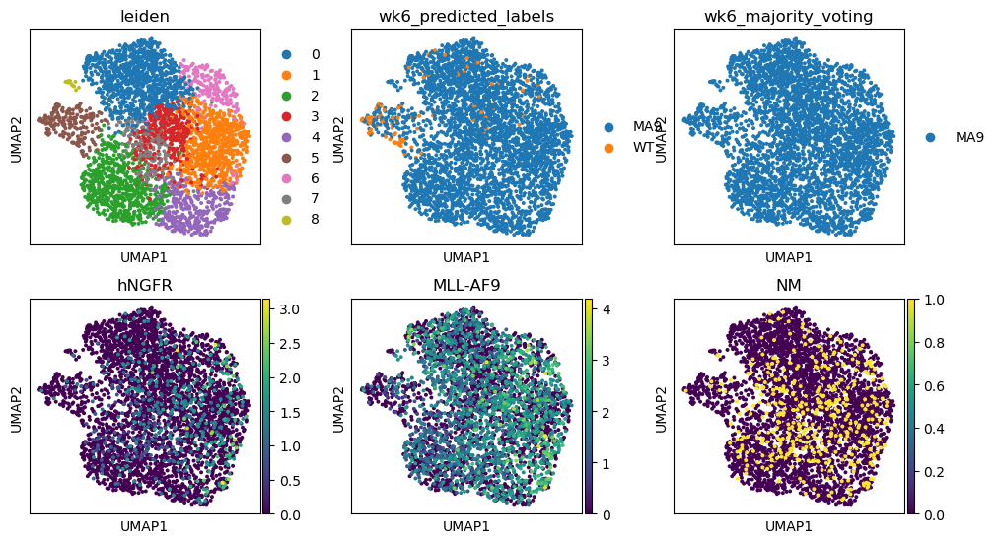

In [706]:
rna_h3 = mdatas[1].mod['rna'].copy()

nm = (rna_h3.to_df()['hNGFR'] > 0).values & (rna_h3.to_df()['MLL-AF9'] > 0).values 
rna_h3.obs['NM'] = nm + 0
rna_h3.var['MLL-AF9'] = rna_h3.to_df()['MLL-AF9']
#sc.pl.umap(rna_h3, color = ['leiden', 'oldway_predicted_labels', 'oldway_majority_voting', 'wk8_majority_voting', 'wk8_predicted_labels', 'hNGFR', 'MLL-AF9', 'NM'], use_raw=False, ncols = 4)
sc.pl.umap(rna_h3, color = ['leiden', 'wk6_predicted_labels', 'wk6_majority_voting', 'hNGFR', 'MLL-AF9', 'NM'], use_raw=False, ncols = 3)


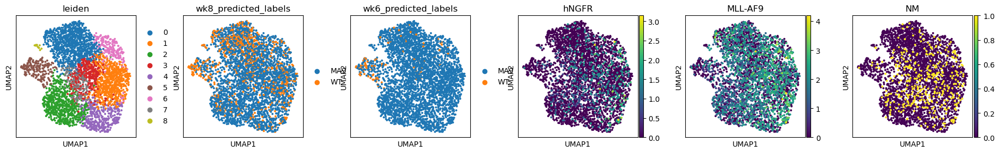

In [820]:
rna_h4 = mdatas[1].mod['rna'].copy()

nm = (rna_h4.to_df()['hNGFR'] > 0).values & (rna_h4.to_df()['MLL-AF9'] > 0).values 
rna_h4.obs['NM'] = nm + 0
rna_h4.var['MLL-AF9'] = rna_h4.to_df()['MLL-AF9']
sc.pl.umap(rna_h4, color = ['leiden', 'wk8_predicted_labels', 'wk6_predicted_labels', 'hNGFR', 'MLL-AF9', 'NM'], use_raw=False, ncols = 6)


# data export

In [ ]:
# this can run after the next plot section
rows, cols = design.shape
for ii in np.arange(rows):
    mdata = mdatas[ii]
    h5file_save = design.loc[design.index[ii], 'h5file_celltype_save']
    print(h5file_save)
    mdata.write(h5file_save)


In [12]:
# only for loading data for re-analysis 
mdatas = [mu.read(fname) for fname in design['h5file_celltype_save'] ]


In [ ]:
ann_cols = [ 'oldway_predicted_labels',  'oldway_over_clustering',  'oldway_majority_voting',  'oldway_conf_score',
            'dp_predicted_labels',  'dp_over_clustering',  'dp_majority_voting',  'dp_conf_score',
            'celltype_predicted_labels', 'celltype_over_clustering',  'celltype_majority_voting', 'celltype_conf_score',
            'celtype_d1_predicted_labels', 'celtype_d1_over_clustering', 'celtype_d1_majority_voting', 'celtype_d1_conf_score',
            'hNFGR_predicted_labels', 'hNFGR_over_clustering', 'hNFGR_majority_voting', 'hNFGR_conf_score']


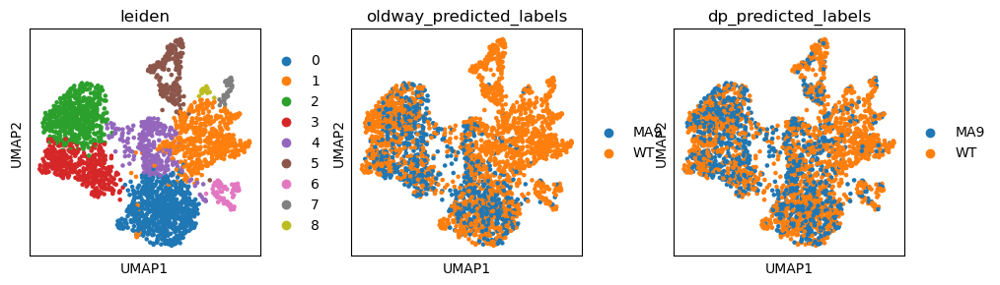

In [250]:
rna_h2 = mdatas[0].mod['rna'].copy()
sc.pl.umap(rna_h2, color = ['leiden', 'oldway_predicted_labels', 'dp_predicted_labels'])


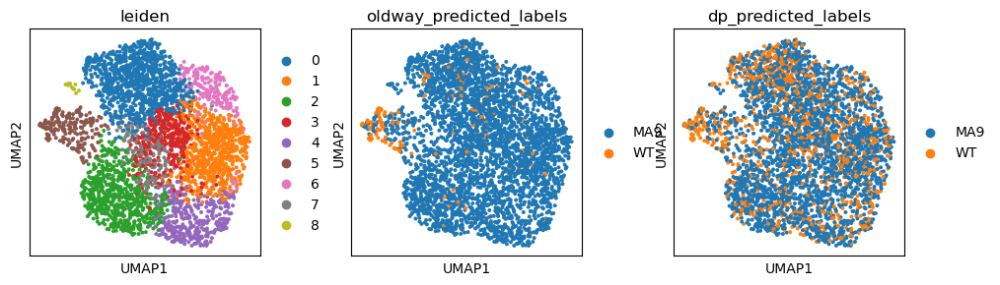

In [251]:
rna_h3 = mdatas[1].mod['rna'].copy()
sc.pl.umap(rna_h3, color = ['leiden', 'oldway_predicted_labels', 'dp_predicted_labels'])


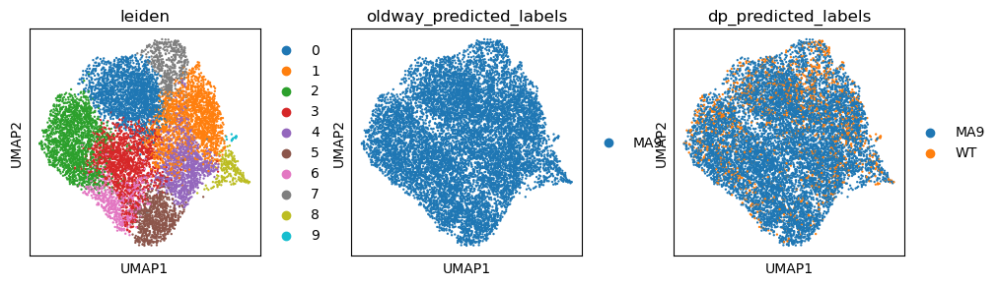

In [252]:
rna_h4 = mdatas[2].mod['rna'].copy()
sc.pl.umap(rna_h4, color = ['leiden', 'oldway_predicted_labels', 'dp_predicted_labels'])


In [66]:
rna_h2_2 = rna_h2.copy()
sc.pp.recipe_zheng17(rna_h2_2)
sc.tl.pca(rna_h2_2, svd_solver="arpack")
sc.pp.neighbors(rna_h2_2, n_neighbors=4, n_pcs=20)
sc.tl.draw_graph(rna_h2_2)


In [67]:
rna_h2_2.obs['genotype_majority_voting'].value_counts()

WT     2274
MA9     505
Name: genotype_majority_voting, dtype: int64

In [68]:
rna_h2_2.obs[['genotype_majority_voting', 'hNFGR_majority_voting']].value_counts()


genotype_majority_voting  hNFGR_majority_voting
WT                        WT                       2175
MA9                       WT                        396
                          hNFGR                     109
WT                        hNFGR                      99
dtype: int64

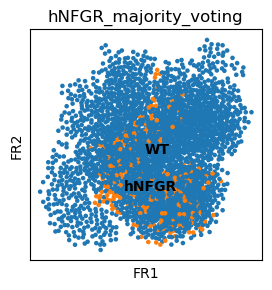

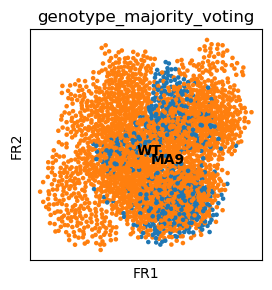

In [70]:
sc.pl.draw_graph(rna_h2_2, color = 'hNFGR_majority_voting', legend_loc="on data")
sc.pl.draw_graph(rna_h2_2, color = 'genotype_majority_voting', legend_loc="on data")


In [16]:
sc.tl.paga(rna_h2_2, groups="leiden")


In [ ]:
sc.pl.paga(rna_h2_2, color=["leiden", "Hba-a2", "Elane", "Irf8"])


In [ ]:
# load the data if hasn't 
mdatas = [mu.read(fname) for fname in design['h5file_celltype_save']]


In [16]:
len(mdatas)

14

In [32]:
gse81682_features = np.loadtxt('data/gse81682_model_features', dtype = 'str', delimiter = '\t')
var_genes_ma9_features = np.loadtxt('data/ma9_wt_model_features', delimiter = '\t', dtype = 'str')


In [33]:
# test H2 sample
rna = mdatas[0].mod['rna'].copy()
rna.X = rna.layers['counts']
sc.pp.normalize_total(rna, target_sum=1e4)
sc.pp.log1p(rna) 

# add the features that used in celltypist
rna.var.loc[:, 'hihgly_varied'] = False
var_names = rna.var.index
var_sel = var_names.intersection(var_genes_ma9_features)
rna.var.loc[var_sel, 'hihgly_varied'] = True


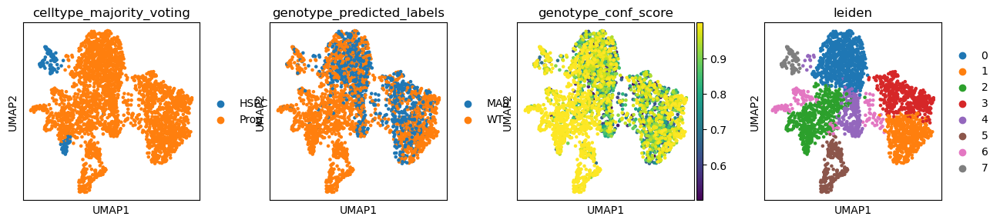

In [48]:
sc.pl.umap(rna, color  = ['celltype_majority_voting', 'genotype_predicted_labels', 'genotype_conf_score', 'leiden'])


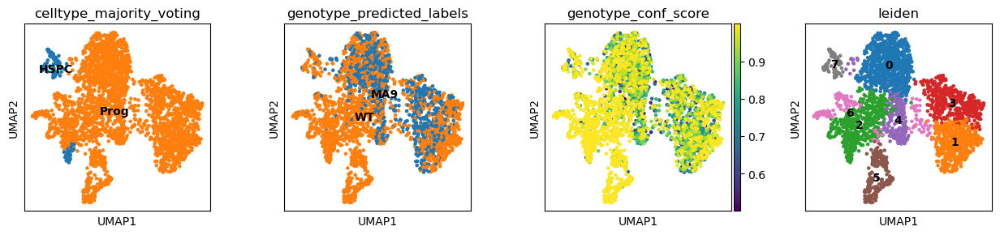

In [49]:
sc.pl.umap(rna, color  = ['celltype_majority_voting', 'genotype_predicted_labels', 
                          'genotype_conf_score', 'leiden'], legend_loc = 'on data')


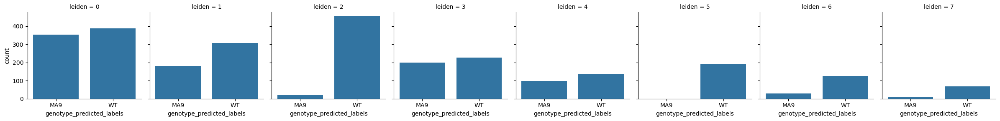

In [28]:
g = sns.FacetGrid(rna.obs, col="leiden")
g.map(sns.countplot, "genotype_predicted_labels")


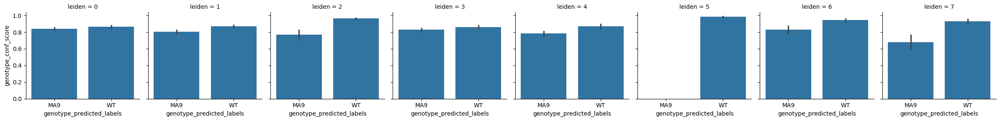

In [29]:
g = sns.FacetGrid(rna.obs, col="leiden")
g.map(sns.barplot, "genotype_predicted_labels", "genotype_conf_score")


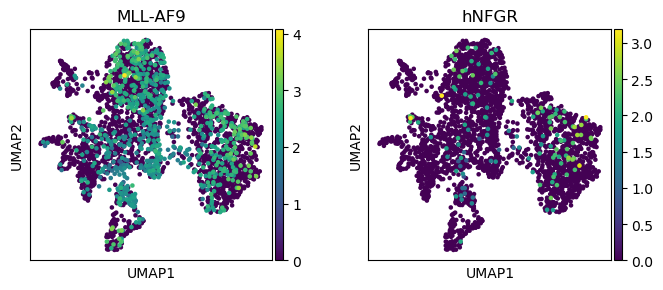

In [34]:
sc.pl.umap(rna, color = ['MLL-AF9', 'hNFGR'], legend_loc = 'on data')


In [50]:
rna_mtx = rna.X.toarray()

In [77]:
#bin_edges = np.array([0, 1, 10])
#count_table = pd.cut(rna[:,'hNFGR'], bins=bin_edges).value_counts().sort_index()
#count_table

gene_val = rna[:, 'hNFGR'].to_df().values.reshape(-1)
print(len(gene_val[gene_val > 0]))
print(len(gene_val[gene_val <= 0]))


127
2652


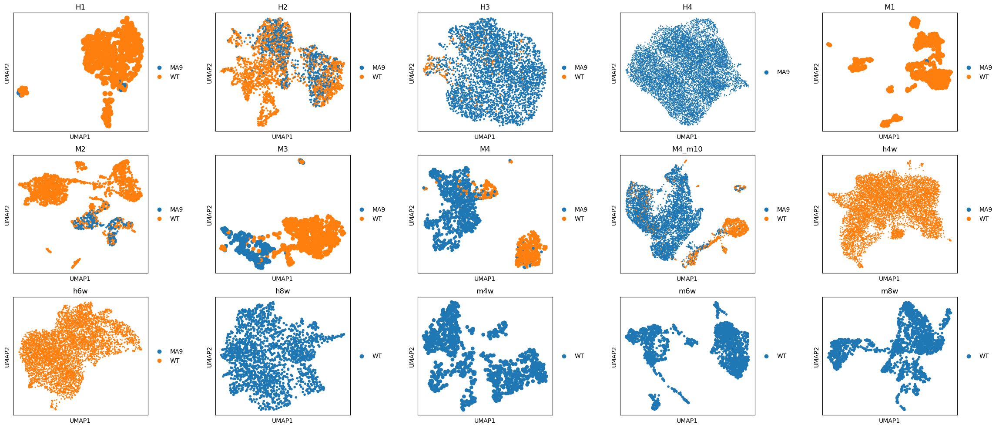

In [71]:
ncols = 5
nrows = 3
figsize = 4
wspace = 0.5
fig, axs = plt.subplots(
    nrows=nrows,
    ncols=ncols,
    figsize=(ncols * figsize + figsize * wspace * (ncols - 1), nrows * figsize),
)
plt.subplots_adjust(wspace=wspace)

ii = 0
for rr in np.arange(nrows):
    for cc in np.arange(ncols):
        mdata = mdatas[ii]
        rna = mdata.mod['rna']
        sc.pl.umap(rna, color="genotype_predicted_labels", show = False, ax = axs[rr, cc], title = design['sname'][ii]) 
        ii = ii + 1
        


UsageError: Line magic function `%R` not found.


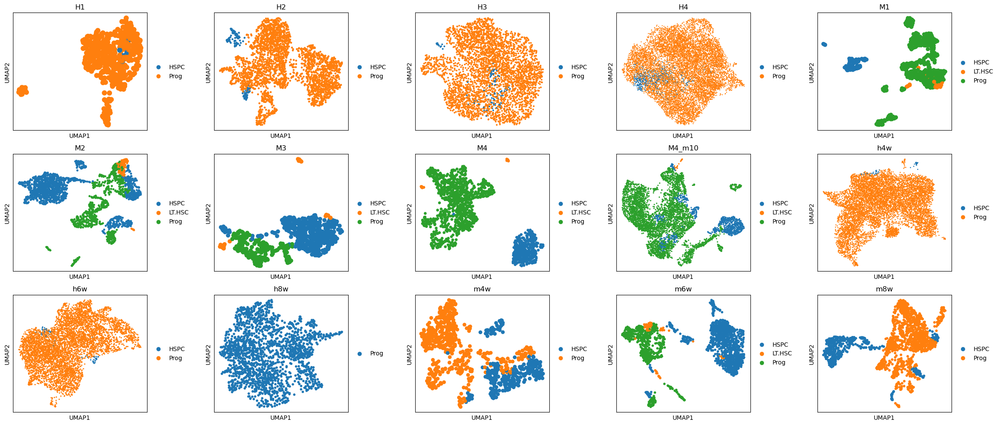

In [72]:
ncols = 5
nrows = 3
figsize = 4
wspace = 0.5
fig, axs = plt.subplots(
    nrows=nrows,
    ncols=ncols,
    figsize=(ncols * figsize + figsize * wspace * (ncols - 1), nrows * figsize),
)
plt.subplots_adjust(wspace=wspace)

ii = 0
for rr in np.arange(nrows):
    for cc in np.arange(ncols):
        mdata = mdatas[ii]
        rna = mdata.mod['rna']
        sc.pl.umap(rna, color="celltype_majority_voting", show = False, ax = axs[rr, cc], title = design['sname'][ii]) 
        ii = ii + 1
        

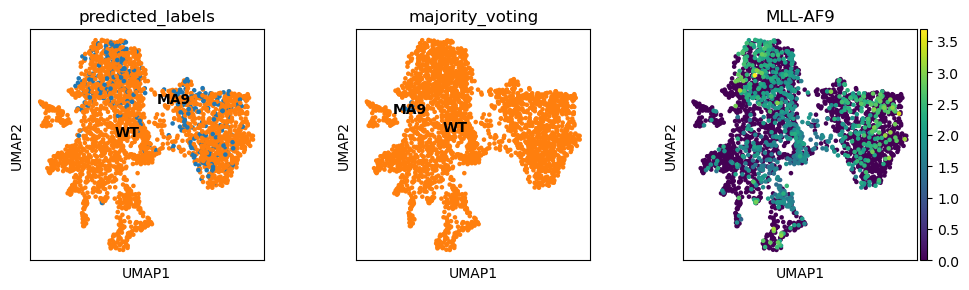

In [94]:
# start with merge two datasets
# the batch var added for sample ID
# 0 is Mll-AF9 positive cells, 1 is wildtype
h4 = mdatas[3].mod['rna'].copy()
h8w = mdatas[11].mod['rna'].copy()
h4h8w = h4.concatenate(h8w)
print(h4.shape)
print(h8w.shape)


(10786, 14069)
(1842, 12910)


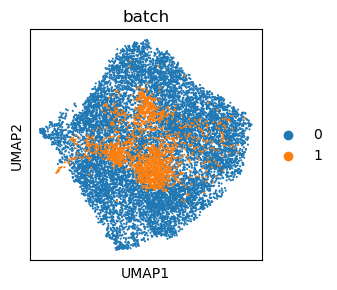

In [95]:
h4h8w.X = h4h8w.layers['counts'].copy()
sc.pp.normalize_total(h4h8w, target_sum=1e4, layer= 'counts')
sc.pp.log1p(h4h8w) 
sc.pp.filter_genes(h4h8w, min_counts=1)
sc.pp.highly_variable_genes(h4h8w, min_mean=0.02, max_mean=4, min_disp=0.5)
sc.pp.neighbors(h4h8w, n_pcs=30)
sc.tl.umap(h4h8w)
sc.tl.leiden(h4h8w)
sc.pl.umap(h4h8w, color="batch")


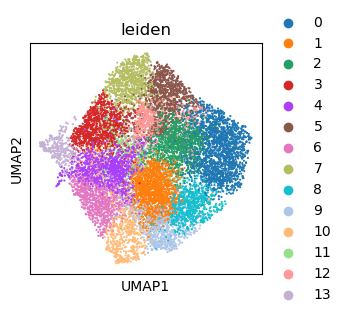

In [96]:
# this is the original UMAP from individual sample analysis
sc.pl.umap(h4h8w, color="leiden")


Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


<Axes: >

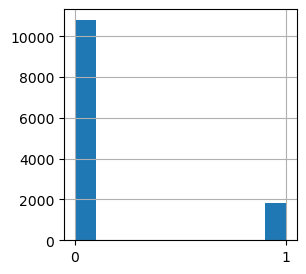

In [97]:
#  check the cell numbers for each sample
h4h8w.obs['batch'].hist()

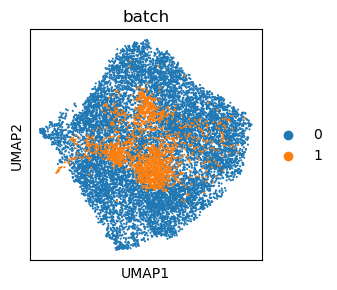

In [98]:
#sc.tl.rank_genes_groups(h4h8w, groupby='batch', key_added='deg_batch')
h4h8w.X = h4h8w.layers['counts'].copy()
sc.pp.normalize_total(h4h8w, target_sum=1e4)
sc.pp.log1p(h4h8w) 
sc.pp.filter_genes(h4h8w, min_counts=1)
sc.pp.highly_variable_genes(h4h8w, min_mean=0.02, max_mean=4, min_disp=0.5)
sc.pp.scale(rna, max_value=10)
sc.tl.pca(rna, svd_solver='arpack')
sc.pp.neighbors(h4h8w, n_pcs=30)
sc.tl.umap(h4h8w)
sc.tl.leiden(h4h8w)
sc.pl.umap(h4h8w, color="batch")


In [100]:
h4h8w.X = h4h8w.layers['counts']
sc.pp.normalize_total(h4h8w, target_sum=1e4)
sc.pp.log1p(h4h8w) 
sc.tl.rank_genes_groups(h4h8w, groupby='batch', key_added='deg_batch')


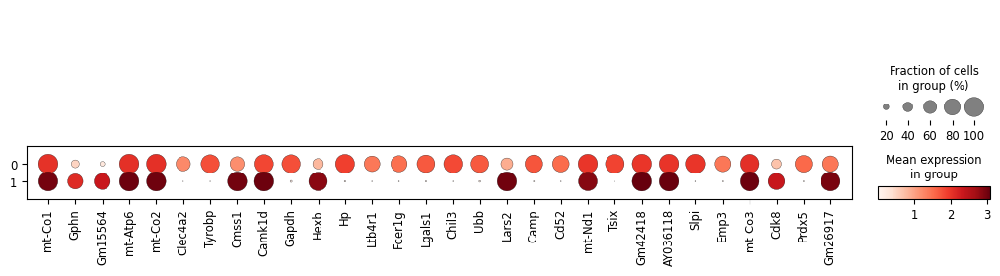

In [103]:
# plot the top DEG
# extract the top 500 DEG genes for next step verification
result = h4h8w.uns['deg_batch']
groups = result['names'].dtype.names
var_genes = set([result['names'][group][ii] for group in groups for ii in np.arange(15)])
#var_genes.add("MLL-AF9")
#var_genes.add("Hoxa9")
var_genes = list(var_genes)
sc.pl.dotplot(h4h8w, var_names=var_genes, groupby="batch", dendrogram=True)
var_genes_1500 = set([result['names'][group][ii] for group in groups for ii in np.arange(1500)])
var_genes_1000 = set([result['names'][group][ii] for group in groups for ii in np.arange(1000)])
var_genes_500 = set([result['names'][group][ii] for group in groups for ii in np.arange(500)])
with open('data/ma9_vs_wt_top500.pkl', 'wb') as dict_file:
    pickle.dump(var_genes_500, dict_file)
with open('data/ma9_vs_wt_top1000.pkl', 'wb') as dict_file:
    pickle.dump(var_genes_1000, dict_file)
with open('data/ma9_vs_wt_top1500.pkl', 'wb') as dict_file:
    pickle.dump(var_genes_1500, dict_file)


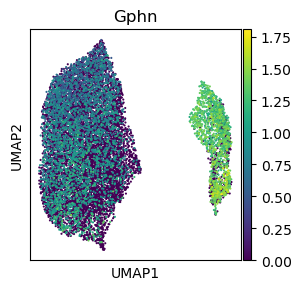

In [157]:
# these genes were able to separate MLL-AF9 cells from wildtype cells in these two samples of course. 
h4h8w = h4.concatenate(h8w)
h4h8w.X = h4h8w.layers['counts'].copy()
sc.pp.normalize_total(h4h8w, target_sum=1e4, layer= 'counts')
sc.pp.log1p(h4h8w) 
#sc.pp.filter_genes(h4h8w, min_counts=1)
#sc.pp.highly_variable_genes(h4h8w, min_mean=0.02, max_mean=4, min_disp=0.5)
h4h8w.var['highly_varied'] = False
h4h8w.var.loc[list(var_genes_1000), 'highly_varied'] = True
tmp = h4h8w[:, h4h8w.var.highly_varied]
sc.tl.pca(tmp, svd_solver="arpack")
sc.pp.neighbors(tmp, n_pcs=30, )
sc.tl.umap(tmp)
sc.tl.leiden(tmp)
sc.pl.umap(tmp, color="Gphn")


In [176]:
len(ma9_wt_model.features)

300

In [178]:
rna = mdatas[1].mod['rna'].copy()
rna.X = rna.layers['counts'].copy()

# add the features that used in celltypist
var_names = rna.var.index
var_sel = var_names.intersection(ma9_wt_model.features)
rna = rna[:, var_sel]
sc.pp.scale(rna, max_value=10)
sc.tl.pca(rna, svd_solver="arpack")
sc.pp.neighbors(rna)
sc.tl.umap(rna)
sc.tl.leiden(rna, resolution=.5)


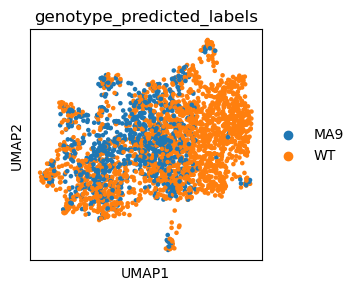

In [179]:
#sc.pl.umap(rna, color=["genotype_predicted_labels", "MLL-AF9", "hNFGR"])
sc.pl.umap(rna, color=["genotype_predicted_labels"], layer = 'counts')


In [170]:
rna.obs['genotype_predicted_labels'].value_counts()

genotype_predicted_labels
WT     1893
MA9     886
Name: count, dtype: int64

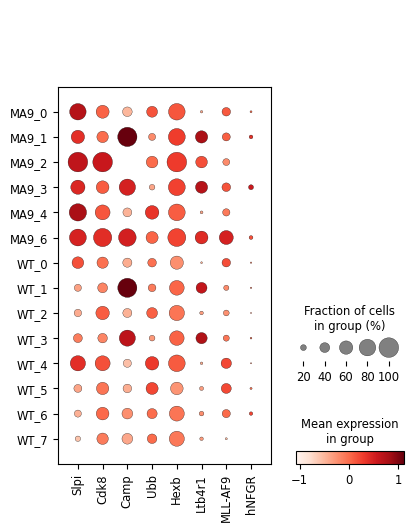

In [34]:
markers = set(['Ltb4r1', 'Ubb', 'Camp', 'Slpi', 'Cdk8', 'Hexb', "MLL-AF9", "hNFGR"])
tmp = rna.var.index
markers = tmp.intersection(markers)
#sc.pl.dotplot(rna, markers, groupby = 'genotype_predicted_labels')
sc.pl.dotplot(rna, markers, groupby = ['genotype_majority_voting', 'leiden'])


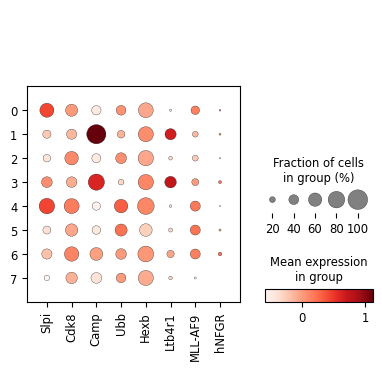

In [35]:
sc.pl.dotplot(rna, markers, groupby = ['leiden'])


In [171]:
886 / (886 + 1893)

0.3188197193234977

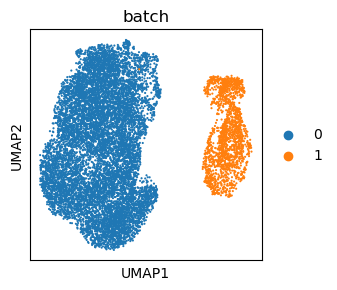

In [109]:
# these genes were able to separate MLL-AF9 cells from wildtype cells in these two samples of course. 
h4h8w = h4.concatenate(h8w)
h4h8w.X = h4h8w.layers['counts']
sc.pp.normalize_total(h4h8w, target_sum=1e4, layer= 'counts')
sc.pp.log1p(h4h8w) 
#sc.pp.filter_genes(h4h8w, min_counts=1)
#sc.pp.highly_variable_genes(h4h8w, min_mean=0.02, max_mean=4, min_disp=0.5)
h4h8w.var['highly_varied'] = False
h4h8w.var.loc[list(var_genes_1500), 'highly_varied'] = True
sc.tl.pca(h4h8w, svd_solver="arpack")
sc.pp.neighbors(h4h8w, n_pcs=30, )
sc.tl.umap(h4h8w)
sc.tl.leiden(h4h8w)
sc.pl.umap(h4h8w, color="batch")


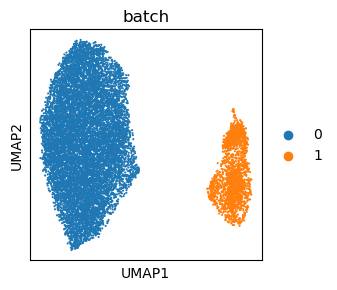

In [111]:
# these genes were able to separate MLL-AF9 cells from wildtype cells in these two samples of course. 
h4h8w = h4.concatenate(h8w)
h4h8w.X = h4h8w.layers['counts']
sc.pp.normalize_total(h4h8w, target_sum=1e4, layer= 'counts')
sc.pp.log1p(h4h8w) 
#sc.pp.filter_genes(h4h8w, min_counts=1)
#sc.pp.highly_variable_genes(h4h8w, min_mean=0.02, max_mean=4, min_disp=0.5)
h4h8w.var['my_var'] = False
h4h8w.var.loc[list(var_genes_500), 'my_var'] = True
tmp = h4h8w[:, h4h8w.var.my_var]
sc.tl.pca(tmp, svd_solver="arpack")
sc.pp.neighbors(tmp, n_pcs=30, )
sc.tl.umap(tmp)
sc.tl.leiden(tmp)
sc.pl.umap(tmp, color="batch")


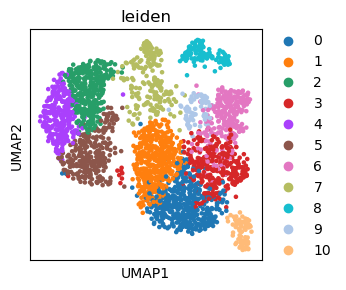

In [173]:
rna = mdatas[1].mod['rna'].copy()
rna.X = rna.layers['counts'].copy()
sc.pp.normalize_total(rna, target_sum=1e4)
sc.pp.log1p(rna) 
sc.pp.highly_variable_genes(rna, min_mean=0.02, max_mean=4, min_disp=0.5)
rna.var.loc[: , 'highly_variable'] = False
rna.var.loc[rna.var.index.isin(list(var_genes_1500)), 'highly_variable'] = True
sc.pp.scale(rna, max_value=10)
sc.tl.pca(rna, svd_solver="arpack")
sc.pp.neighbors(rna, n_pcs=30, )
sc.tl.umap(rna)
sc.tl.leiden(rna)
sc.pl.umap(rna, color=["leiden", ""])

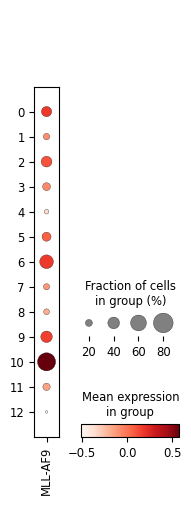

In [468]:
var_genes = ['MLL-AF9']
sc.pl.dotplot(rna, var_names=var_genes, groupby="leiden")


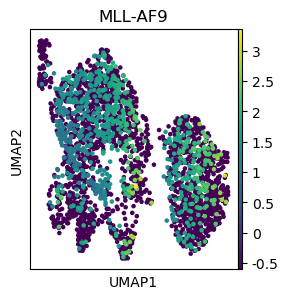

In [469]:
sc.pl.scatter(rna, basis='umap', color = 'MLL-AF9')


In [ ]:
rows, cols = design.shape
for ii in np.arange(nrows):
    mdata = mdatas[ii]
    rna = mdata.mod['rna']
    sc.pl.rank_genes_groups_dotplot(rna, n_genes=4)


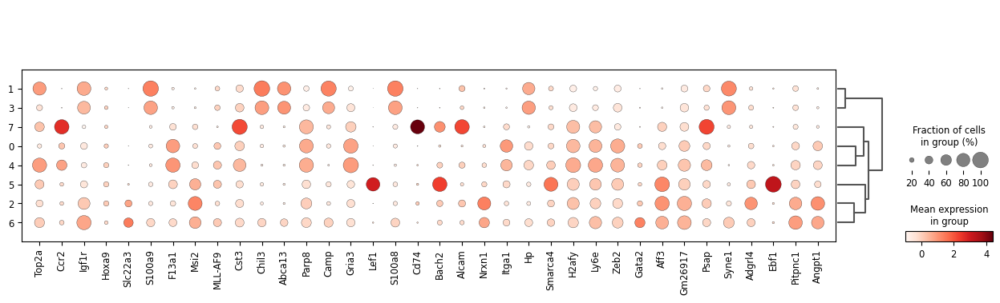

In [344]:
rna = mdatas[1].mod['rna']
result = rna.uns['rank_genes_groups']
groups = result['names'].dtype.names
var_genes = set([result['names'][group][ii] for group in groups for ii in np.arange(5)])
var_genes.add("MLL-AF9")
var_genes.add("Hoxa9")
var_genes = list(var_genes)
sc.pl.dotplot(rna, var_names=var_genes, groupby="leiden", dendrogram=True)


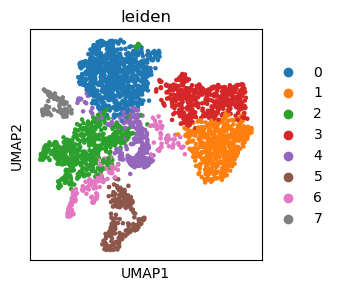

In [342]:
ii = 1
mdata = mdatas[ii]
rna = mdata.mod['rna']
sc.pl.umap(rna, color="leiden", show = True)


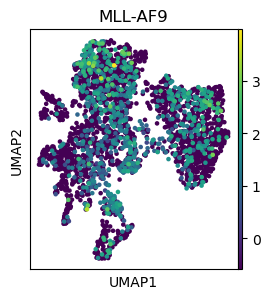

In [349]:
sc.pl.scatter(rna, basis='umap', color='MLL-AF9')


In [95]:
cell_cycle_genes = pd.read_table('cell_cycle_genes.tsv', sep = '\t')
h2m = pd.read_csv('/home/whu78/workspace/human_to_mouse.csv')
cell_cycle_genes = pd.merge(cell_cycle_genes, h2m, left_on = 'gene_name', right_on = 'Gene name', how = 'inner')
s_genes = cell_cycle_genes['Mouse gene name'][cell_cycle_genes['gene_type'] == 's_gene'].values
g2m_genes = cell_cycle_genes['Mouse gene name'][cell_cycle_genes['gene_type'] == 'g2m_gene'].values
s_genes

array(['Mcm5', 'Pcna', 'Tyms', 'Fen1', 'Mcm2', 'Mcm4', 'Rrm1', 'Ung',
       'Gins2', 'Mcm6', 'Cdca7', 'Dtl', 'Prim1', 'Uhrf1', 'Hells', 'Rfc2',
       'Rpa2', 'Nasp', 'Rad51ap1', 'Gmnn', 'Wdr76', 'Slbp', 'Ccne2', nan,
       'Ubr7', nan, 'Msh2', nan, 'Rad51', 'Rrm2', 'Cdc45', 'Cdc6', 'Exo1',
       'Tipin', 'Dscc1', 'Blm', nan, 'Casp8ap2', 'Usp1', 'Clspn', 'Pola1',
       'Chaf1b', 'Brip1', 'E2f8'], dtype=object)

In [120]:
for mdata in mdatas:
    rna = mdata.mod['rna']
    sc.tl.score_genes_cell_cycle(rna, s_genes=s_genes, g2m_genes=g2m_genes)


In [ ]:
ncols = 5
nrows = 3
figsize = 4
wspace = 0.5
fig, axs = plt.subplots(
    nrows=nrows,
    ncols=ncols,
    figsize=(ncols * figsize + figsize * wspace * (ncols - 1), nrows * figsize),
)
plt.subplots_adjust(wspace=wspace)

ii = 0
for rr in np.arange(nrows):
    for cc in np.arange(ncols):
        mdata = mdatas[ii]
        rna = mdata.mod['rna']
        sc.pl.pca_scatter(rna, color='phase', show = False, ax = axs[rr, cc], title = design['sname'][ii] + ' phase')
        ii = ii + 1


In [121]:
ii = 0
for mdata in mdatas:
    fname = design['h5file_save'][ii]
    mdata.write_h5mu(fname)
    ii = ii + 1

In [20]:
mamba install snapatac2


Looking for: ['snapatac2']

[+] 0.0s
conda-forge/linux-64 ━━━━━━╸━━━━━━━━━━━━━━━━   0.0 B /  ??.?MB @  ??.?MB/s  0.0s[+] 0.1s
conda-forge/linux-64 ━━━━━━━╸━━━━━━━━━━━━━━━   0.0 B /  ??.?MB @  ??.?MB/s  0.1s
conda-forge/noarch   ━━━━━━━━━━━╸━━━━━━━━━━━   0.0 B /  ??.?MB @  ??.?MB/s  0.1s
bioconda/linux-64    ━━━━━━━━━╸━━━━━━━━━━━━━   0.0 B /  ??.?MB @  ??.?MB/s  0.1s
bioconda/noarch      ━━━━━━━━━━━╸━━━━━━━━━━━   0.0 B /  ??.?MB @  ??.?MB/s  0.1s
pkgs/main/linux-64   ╸━━━━━━━━━━━━━━━╸━━━━━━   0.0 B /  ??.?MB @  ??.?MB/s  0.1s[+] 0.2s
conda-forge/linux-64 ━━━━━━━━━━━━━━━━━━━━━━━  35.6kB /  34.1MB @ 209.8kB/s  0.2s
conda-forge/noarch   ━━━━━━━━━━━━━━╸━━━━━━━━   0.0 B /  ??.?MB @  ??.?MB/s  0.2s
bioconda/linux-64    ━━━━━━━━━━━╸━━━━━━━━━━━  72.5kB /  ??.?MB @ 427.9kB/s  0.2s
bioconda/noarch      ━━━━━━━╸━━━━━━━━━━━━━━━  65.6kB /  ??.?MB @ 387.5kB/s  0.2s
pkgs/main/linux-64   ━━━━━━━╸━━━━━━━━━━━━━━━   2.2MB /   6.0MB @  13.3MB/s  0.2spkgs/main/linux-64                                   6.0

# merge RNASeq for all cells 

In [ ]:
# re-load data
# mdatas = [mu.read(fname) for fname in design['h5file_celltype_save'] ]
# adata_rna_full = ad.read_h5ad(base_dir + 'data/adata_rna_nb_niche_scRNA_Apr24.h5a')
# adata_full_hvg = ad.read_h5ad(base_dir + 'data/adata_full_hvg_nb_niche_scRNA_Apr24.h5a')
# adata_full_bbknn = sc.read_h5ad('data/adata_full_bbknn_nb_niche_scRNA_2024May06.h5ad')


## merge RNASeq samples

In [14]:
adata_rna_set = {design['sample_name'][ii] : mdatas[ii].mod['rna'] for ii in np.arange(design.shape[0])}

In [14]:
adata_rna = ad.concat(adata_rna_set, index_unique = '_', label = 'sampleID')
adata_rna.layers['counts'] = adata_rna.X.copy()

In [15]:
adata_rna_full = ad.concat(adata_rna_set, index_unique = '_', label = 'sampleID', join = 'outer')
adata_rna_full.layers['counts'] = adata_rna_full.X.copy()


## doublet identification for merged RNASeq

In [32]:
# by scrublet
mtx = adata_rna_full.to_df()
scrub = scr.Scrublet(mtx) 
doublet_scores, predicted_doublets = scrub.scrub_doublets()
scrublet_df = pd.DataFrame({'doublet_scores' : doublet_scores, 'predicted_doublets' : predicted_doublets}, index = mtx.index)
scrublet_df.to_csv('data/rnaseq_merged_scrublet.csv')
print(pd.Series(predicted_doublets).value_counts())


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.45
Detected doublet rate = 0.9%
Estimated detectable doublet fraction = 58.1%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 1.5%
Elapsed time: 135.1 seconds
False    59709
True       538
Name: count, dtype: int64


In [381]:
%%R
design[, .(sample_name, sname, sampleID)]

    sample_name sname      sampleID
 1:          H2    H2   MA9_HSC_wk4
 2:          H3    H3   MA9_HSC_wk6
 3:          H4    H4   MA9_HSC_wk8
 4:          M2    M2   MA9_MSC_wk4
 5:          M3    M3   MA9_MSC_wk6
 6:          M4    M4   MA9_MSC_wk8
 7:      M4_m10   m10 MA9_MSC_wk8r2
 8:    ctrl_h4w   h4w  Ctrl_HSC_wk4
 9:    ctrl_h6w   h6w  Ctrl_HSC_wk6
10:    ctrl_h8w   h8w  Ctrl_HSC_wk8
11:    ctrl_m4w   m4w  Ctrl_MSC_wk4
12:    ctrl_m6w   m6w  Ctrl_MSC_wk6
13:    ctrl_m8w   m8w  Ctrl_MSC_wk8
14:     trp_h90   h90       TRP_HSC
15:     trp_m90   m90       TRP_MSC


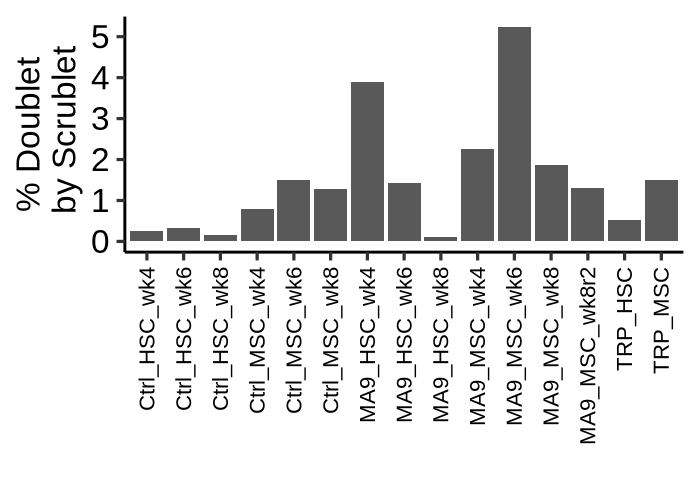

In [81]:
%%R -i scrublet_df -w 700 -h  500 -r 200
library(ggpubr)
tmp = as.data.table(scrublet_df, keep.rownames = T)
tmp[, sampleID := sub('.*_', '', rn)]

tmp2 = as.data.table(as.data.frame.matrix(table(tmp$sampleID, tmp$predicted_doublets) ), keep.rownames = T)
setnames(tmp2, c('sampleID', 'singlet', 'doublet'))
setkey(design, 'sname')
tmp2$sampleID2 = design[tmp2$sampleID, sampleID] 
tmp2[, per := 100 * doublet / (singlet + doublet) ] 
ggplot(tmp2, aes(sampleID2, per)) + geom_bar(stat = 'identity') + theme_pubr() + 
theme(axis.text.x = element_text(angle = 90, vjust = .5, hjust = 1, size = 8)) + 
xlab('') + ylab('% Doublet\n by Scrublet')

In [33]:
adata_rna_full.obs['scrublet_class'] = scrublet_df['predicted_doublets']
adata_rna_full.obs['scrublet_score'] = scrublet_df['doublet_scores']

adata_rna_full.obs['SCRUBLET'] = 'singlet'
adata_rna_full.obs.loc[adata_rna_full.obs['scrublet_class'], 'SCRUBLET'] = 'doublet'

In [ ]:
#scDblFinder can use nb_niche_Apr3_R.ipynb
cmd = """
library(data.table)
library(dplyr)
library(SingleCellExperiment)
library(anndata)
library(scDblFinder)

base_dir = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_JinWang/'
setwd(base_dir)

fname = paste0(base_dir, 'data/adata_rna_nb_niche_scRNA_Apr24.h5a')
oo <- read_h5ad(fname)
counts = t(oo$X)
sce = SingleCellExperiment(list(counts = counts))
sce <- scDblFinder(sce, dbr=0.1)

tmp = sce@colData
colnames(tmp) = sub('\\.', '_', colnames(tmp))
write.table(sce@colData, file = 'data2/scDblFinder_merged_rnaseq_based.tsv', sep = '\t') 

fname = paste0('data2/merged_scrna_scdblfinder_may1.rds')
saveRDS(sce, file = fname)

"""
fname = base_dir + 'run_scDblFinder.R'
f = open(fname, "w")
f.write(cmd)
f.close()


In [34]:
scdf = pd.read_csv('data2/scDblFinder_merged_rnaseq_based.tsv', sep = '\t') 
adata_rna_full.obs['scDblFinder_class'] = scdf['scDblFinder_class'] 
adata_rna_full.obs['scDblFinder_score'] = scdf['scDblFinder_score'] 
adata_rna_full.obs['scDblFinder_weighted'] = scdf['scDblFinder_weighted'] 
adata_rna_full.obs['scDblFinder_cxds_score'] = scdf['scDblFinder_cxds_score'] 


In [84]:
%%R
head(design)

                                                                                      
1 new("standardGeneric", .Data = function (object, ...)                               
2 standardGeneric("design"), generic = structure("design", package = "BiocGenerics"), 
3     package = "BiocGenerics", group = list(), valueClass = character(0),            
4     signature = "object", default = NULL, skeleton = (function (object,             
5         ...)                                                                        
6     stop(gettextf("invalid call in method dispatch to '%s' (no default method)",    


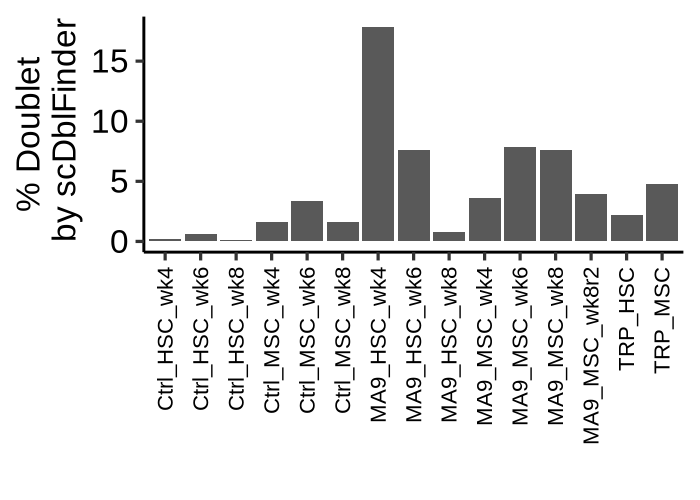

In [128]:
%%R -i scrublet_df -w 700 -h 500 -r 200
library(ggpubr)
tmp = fread('data2/scDblFinder_merged_rnaseq_based.tsv')

tmp2 = as.data.table(as.data.frame.matrix(table(tmp$samples, tmp$scDblFinder_class)), keep.rownames = T)
setnames(tmp2, c('sampleID', 'doublet', 'singlet'))
setkey(design, 'sample_name')
tmp2$sampleID2 = design[tmp2$sampleID, sampleID]
tmp2[, per := 100 * doublet / (singlet + doublet) ] 
ggplot(tmp2, aes(sampleID2, per)) + geom_bar(stat = 'identity') + theme_pubr() + 
theme(axis.text.x = element_text(angle = 90, vjust = .5, hjust = 1, size = 8)) + 
xlab('') + ylab('% Doublet\n by scDblFinder')


In [ ]:
# scDblFinder based on ATACSeq
cmd = """
library(data.table)
library(dplyr)
library(SingleCellExperiment)
library(anndata)
library(scDblFinder)

base_dir = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_JinWang/'
setwd(base_dir)

design = fread('data/dsn_dt_base_v2.tsv')

args = commandArgs(trailingOnly=TRUE)

ii = as.integer( args[1] )

fname = design[ii, h5file_atac_save]
oo <- read_h5ad(fname)
counts = t(oo$X)
sce = SingleCellExperiment(list(counts = counts))
sce <- scDblFinder(sce, artificialDoublets=1, aggregateFeatures=TRUE, nfeatures=25, processing="normFeatures")

fname = paste0('data2/sce_', ii, '_atac.rds')
saveRDS(sce, file = fname)

"""

fname = base_dir + 'run_scDblFinder_atac.R'
f = open(fname, "w")
f.write(cmd)
f.close()


## for merged RNASeq: clustering BBKNN

In [35]:
sc.pp.highly_variable_genes( adata_rna_full, n_top_genes = 2000, flavor = "cell_ranger", batch_key = 'sampleID' )


... storing 'scDblFinder_class' as categorical
... storing 'SCRUBLET' as categorical


highly_variable_nbatches
0     7468
1     3942
2     1873
3     1102
4      612
5      534
6      389
7      326
8      263
9      191
10     155
11     119
12      91
13      54
14      44
15      12
Name: count, dtype: int64

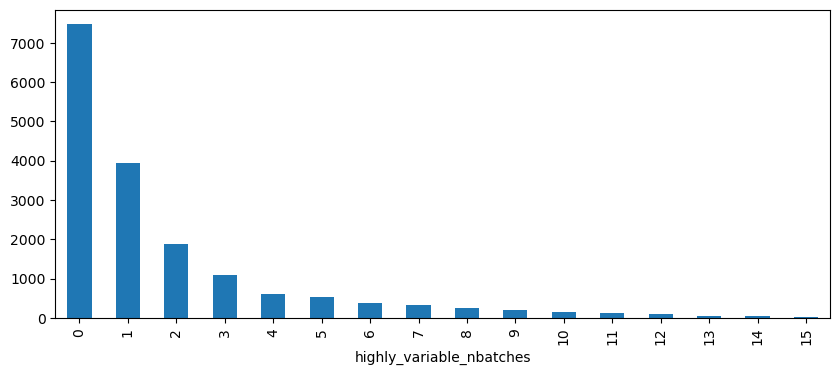

In [36]:
n_batches = adata_rna_full.var["highly_variable_nbatches"].value_counts()
ax = n_batches.plot(kind="bar", figsize = (10, 4))
n_batches


In [90]:
adata_full_hvg = adata_rna_full[:, adata_rna_full.var["highly_variable"]].copy()
adata_full_hvg


AnnData object with n_obs × n_vars = 60247 × 2003
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'leiden', 'ngfr_predicted_labels', 'ngfr_over_clustering', 'ngfr_majority_voting', 'ngfr_conf_score', 'wk4_predicted_labels', 'wk4_over_clustering', 'wk4_majority_voting', 'wk4_conf_score', 'wk6_predicted_labels', 'wk6_over_clustering', 'wk6_majority_voting', 'wk6_conf_score', 'wk8_predicted_labels', 'wk8_over_clustering', 'wk8_majority_voting', 'wk8_conf_score', 'oldway_predicted_labels', 'oldway_over_clustering', 'oldway_majority_voting', 'oldway_conf_score', 'dp_predicted_labels', 'dp_over_clustering', 'dp_majority_voting', 'dp_conf_score', 'hspc_predicted_labels', 'hspc_over_clustering', 'hspc_majority_voting', 'hspc_conf_score', 'celltype_d1_predicted_labels', 'celltype_d1_over_clustering', 'celltype_d1_majority_voting', 'celltype_d1_conf_score', 'hNFGR_predicted_labels', 'hNF

## export merged RNA results

In [482]:
adata_full_hvg.write_h5ad(base_dir + 'data/adata_full_hvg_nb_niche_scRNA_Apr24.h5a')
adata_rna_full.write_h5ad(base_dir + 'data/adata_rna_full_nb_niche_scRNA_Apr24.h5a')


## run BBKNN

In [91]:
neighbors_within_batch = 25 if adata_full_hvg.n_obs > 100000 else 3
neighbors_within_batch


3

In [484]:
adata_full_bbknn = adata_full_hvg.copy()
adata_full_bbknn.X = adata_full_bbknn.layers["counts"].copy()
sc.pp.pca(adata_full_bbknn)

In [485]:
bbknn.bbknn( adata_full_bbknn, batch_key='sampleID', neighbors_within_batch=neighbors_within_batch )

In [486]:
sc.tl.umap(adata_full_bbknn)
sc.tl.leiden(adata_full_bbknn)

In [ ]:
adata_full_bbknn.write_h5ad('data/adata_full_bbknn_nb_niche_scRNA_2024May06.h5ad')
adata_full_bbknn


In [19]:
adata_full_bbknn = sc.read_h5ad('data/adata_full_bbknn_nb_niche_scRNA_2024May06.h5ad')


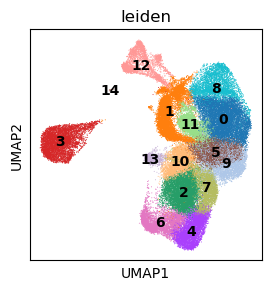

In [636]:
ax = sc.pl.umap(adata_full_bbknn, color = ['leiden'], show = False, legend_loc = 'on data')
x_min, x_max = ax.get_xlim()
y_min, y_max = ax.get_ylim()


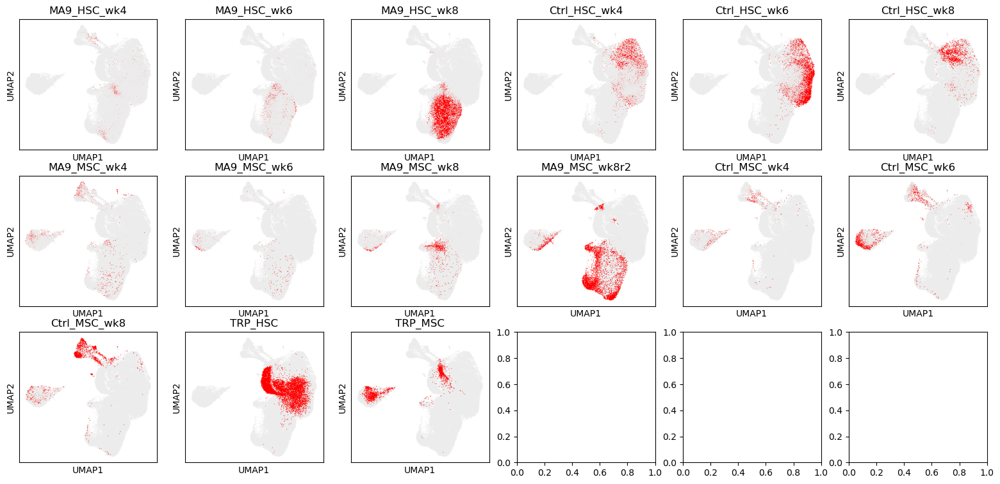

In [436]:
ncol = 6
nrow = 3
figsize = 3
wspace = 0.1 
fig, axes = plt.subplots(
    nrow, ncol, figsize=(ncol * figsize + (ncol - 1) * wspace * figsize, nrow * figsize)
)
#plt.subplots_adjust(wspace=wspace)

ll = 0
for i in range(nrow):
    for j in range(ncol):
        if ll == design.shape[0]:
            break
        else:
            palette = {ii : '#ECECEC' for ii in design['sample_name']} 
            ij_sample_name = design.loc[ll, 'sample_name']
            ij_title = design.loc[ll, 'sampleID']
            palette.update({ij_sample_name : 'red'})
            ax = sc.pl.umap(adata_full_bbknn, color = 'sampleID', palette = palette, show = False, ax = axes[i][j], legend_loc = None, title = ij_title)
            ax.set_xlim((x_min, x_max))
            ax.set_ylim((y_min, y_max))
        ll += 1
plt.subplots_adjust()
plt.show()


## plot doublet


In [21]:
#adata_full_bbknn.obs[['scrublet', 'leiden']].column.dtype
adata_full_bbknn.obs.scrublet.dtype
adata_full_bbknn.obs.leiden.dtype

CategoricalDtype(categories=['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
                  '12', '13', '14', '15'],
, ordered=False, categories_dtype=object)

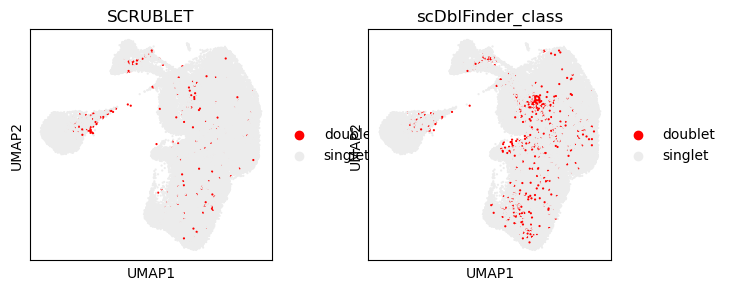

In [22]:
#palette = {ii : '#F5F5F5' for ii in design['sample_name']} 
palette = { 'singlet': '#ECECEC', 'doublet' : 'red'}
ax = sc.pl.umap(adata_full_bbknn, color = ['SCRUBLET', 'scDblFinder_class'], show = False, palette = palette, size = 10)


## remove doublet & the HSCs from the MSC samples

In [23]:
# exclude the doublet from either Scrubelt and scDblFinder analysis
ii = [ii == 'singlet' for ii in adata_full_bbknn.obs['SCRUBLET']] 
jj = [jj == 'singlet' for jj in adata_full_bbknn.obs['scDblFinder_class']] 
xx = [ii & jj for ii, jj in zip(ii, jj)]
adata_sel_singlet= adata_full_bbknn[xx].copy() 


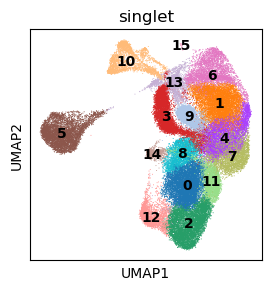

In [84]:
ax = sc.pl.umap(adata_sel_singlet, color = ['leiden'], show = False, legend_loc = 'on data', title = 'singlet')
x_min, x_max = ax.get_xlim()
y_min, y_max = ax.get_ylim() 


In [85]:
# exclude the triple models for now
adata_sel_ma9 = adata_sel_singlet[~adata_sel_singlet.obs['sampleID'].isin(['trp_h90', 'trp_m90'])]
adata_sel_ma9


View of AnnData object with n_obs × n_vars = 46244 × 2003
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'leiden', 'ngfr_predicted_labels', 'ngfr_over_clustering', 'ngfr_majority_voting', 'ngfr_conf_score', 'wk4_predicted_labels', 'wk4_over_clustering', 'wk4_majority_voting', 'wk4_conf_score', 'wk6_predicted_labels', 'wk6_over_clustering', 'wk6_majority_voting', 'wk6_conf_score', 'wk8_predicted_labels', 'wk8_over_clustering', 'wk8_majority_voting', 'wk8_conf_score', 'oldway_predicted_labels', 'oldway_over_clustering', 'oldway_majority_voting', 'oldway_conf_score', 'dp_predicted_labels', 'dp_over_clustering', 'dp_majority_voting', 'dp_conf_score', 'hspc_predicted_labels', 'hspc_over_clustering', 'hspc_majority_voting', 'hspc_conf_score', 'celltype_d1_predicted_labels', 'celltype_d1_over_clustering', 'celltype_d1_majority_voting', 'celltype_d1_conf_score', 'hNFGR_predicted_label

(-9.265780782699585, 12.127565717697143)

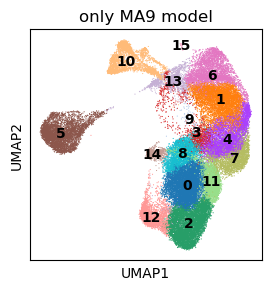

In [29]:
ax = sc.pl.umap(adata_sel_ma9, color = ['leiden'], show = False, legend_loc = 'on data', title = 'only MA9 model')
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)


In [32]:
msc_sampleIDs = ['M2', 'M3', 'M4', 'M4_m10', 'ctrl_m4w', 'ctrl_m6w', 'ctrl_m8w', 'trp_m90']

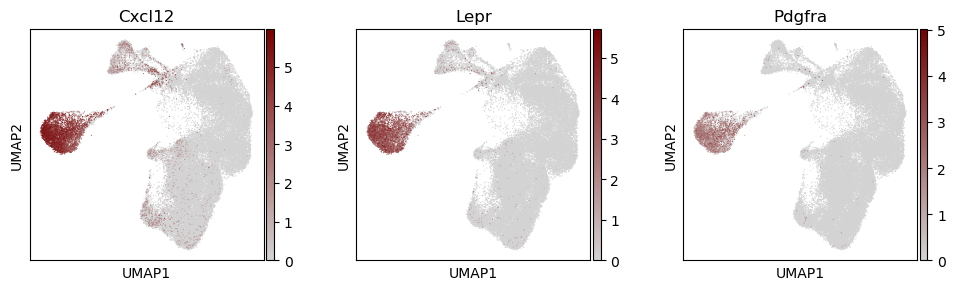

In [33]:
ax = sc.pl.umap(adata_sel_ma9, color = ['Cxcl12', 'Lepr', 'Pdgfra'], show = False, legend_loc = 'on data',
                                                  cmap=sns.blend_palette(["lightgray", sns.xkcd_rgb["blood"]], as_cmap=True) ) 


In [97]:
adata_sel_ma9.write_h5ad('data/adata_sel_ma9_Jul30.h5ad')

In [95]:
# select MSC samples
tmp1 = adata_sel_ma9[adata_sel_ma9.obs['sampleID'].isin(msc_sampleIDs)]
# and then select cluster 3 
tmp1 = tmp1[tmp1.obs['leiden'].eq('5')]
tmp1 


View of AnnData object with n_obs × n_vars = 4158 × 2003
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'leiden', 'ngfr_predicted_labels', 'ngfr_over_clustering', 'ngfr_majority_voting', 'ngfr_conf_score', 'wk4_predicted_labels', 'wk4_over_clustering', 'wk4_majority_voting', 'wk4_conf_score', 'wk6_predicted_labels', 'wk6_over_clustering', 'wk6_majority_voting', 'wk6_conf_score', 'wk8_predicted_labels', 'wk8_over_clustering', 'wk8_majority_voting', 'wk8_conf_score', 'oldway_predicted_labels', 'oldway_over_clustering', 'oldway_majority_voting', 'oldway_conf_score', 'dp_predicted_labels', 'dp_over_clustering', 'dp_majority_voting', 'dp_conf_score', 'hspc_predicted_labels', 'hspc_over_clustering', 'hspc_majority_voting', 'hspc_conf_score', 'celltype_d1_predicted_labels', 'celltype_d1_over_clustering', 'celltype_d1_majority_voting', 'celltype_d1_conf_score', 'hNFGR_predicted_labels

In [96]:
# select non MSC samples
tmp2 = adata_sel_ma9[~adata_sel_ma9.obs['sampleID'].isin(msc_sampleIDs)]
# and then select non cluster 3 
tmp2 = tmp2[~ tmp2.obs['leiden'].eq('5')]
tmp2 


View of AnnData object with n_obs × n_vars = 32459 × 2003
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'leiden', 'ngfr_predicted_labels', 'ngfr_over_clustering', 'ngfr_majority_voting', 'ngfr_conf_score', 'wk4_predicted_labels', 'wk4_over_clustering', 'wk4_majority_voting', 'wk4_conf_score', 'wk6_predicted_labels', 'wk6_over_clustering', 'wk6_majority_voting', 'wk6_conf_score', 'wk8_predicted_labels', 'wk8_over_clustering', 'wk8_majority_voting', 'wk8_conf_score', 'oldway_predicted_labels', 'oldway_over_clustering', 'oldway_majority_voting', 'oldway_conf_score', 'dp_predicted_labels', 'dp_over_clustering', 'dp_majority_voting', 'dp_conf_score', 'hspc_predicted_labels', 'hspc_over_clustering', 'hspc_majority_voting', 'hspc_conf_score', 'celltype_d1_predicted_labels', 'celltype_d1_over_clustering', 'celltype_d1_majority_voting', 'celltype_d1_conf_score', 'hNFGR_predicted_label

(-9.265780782699585, 12.127565717697143)

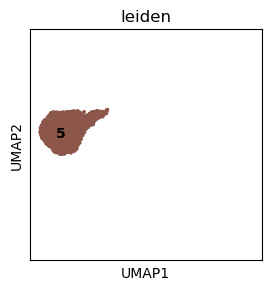

In [98]:
ax = sc.pl.umap(tmp1, color = ['leiden'], show = False, legend_loc = 'on data')
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)


In [105]:
%%R -i obs_df
#obs_df = adata_sel_ma9.obs
as.data.frame.matrix(table(obs_df$sampleID, obs_df$leiden))

            0    1    2   3    4    6    7   8  9 10   11  12  13 14
H2        111  271  617  43  277   81   30 594 21 52   36  63  50  4
H3       1240   50  463  17   55    8    6 908  6  1  548  34  19  0
H4       4629    3 3811  43   22    0   13 473  3  0 1527 111  60  3
ctrl_h4w   12 3026   13 531 1223 2204  997  27  6 15    0   0 289  0
ctrl_h6w   11 1173    9 193 2445  636 1458  16  5  1    0   2  26  0
ctrl_h8w    1  422    7 140   66  531   65   1 10 18    0   2 575  0


In [112]:
# get rid of cluster 9, 10, 12, 13, and 14
tmp2_step2 = tmp2[~tmp2.obs['leiden'].eq('9')]
tmp2_step2 = tmp2_step2[~tmp2_step2.obs['leiden'].eq('3')]
tmp2_step2 = tmp2_step2[~tmp2_step2.obs['leiden'].eq('10')]
tmp2_step2 = tmp2_step2[~tmp2_step2.obs['leiden'].eq('12')]
tmp2_step2 = tmp2_step2[~tmp2_step2.obs['leiden'].eq('13')]
tmp2_step2 = tmp2_step2[~tmp2_step2.obs['leiden'].eq('14')]
tmp2_step2


View of AnnData object with n_obs × n_vars = 30116 × 2003
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'leiden', 'ngfr_predicted_labels', 'ngfr_over_clustering', 'ngfr_majority_voting', 'ngfr_conf_score', 'wk4_predicted_labels', 'wk4_over_clustering', 'wk4_majority_voting', 'wk4_conf_score', 'wk6_predicted_labels', 'wk6_over_clustering', 'wk6_majority_voting', 'wk6_conf_score', 'wk8_predicted_labels', 'wk8_over_clustering', 'wk8_majority_voting', 'wk8_conf_score', 'oldway_predicted_labels', 'oldway_over_clustering', 'oldway_majority_voting', 'oldway_conf_score', 'dp_predicted_labels', 'dp_over_clustering', 'dp_majority_voting', 'dp_conf_score', 'hspc_predicted_labels', 'hspc_over_clustering', 'hspc_majority_voting', 'hspc_conf_score', 'celltype_d1_predicted_labels', 'celltype_d1_over_clustering', 'celltype_d1_majority_voting', 'celltype_d1_conf_score', 'hNFGR_predicted_label

In [116]:
adata_sel = ad.concat([tmp1, tmp2_step2])
adata_sel = adata_rna_full[adata_sel.obs.index]


In [117]:
# save some of the expression in obs
adata_sel.obs['hNGFR_obs']   = adata_sel.to_df()['hNGFR']
adata_sel.obs['MLL-AF9_obs'] = adata_sel.to_df()['MLL-AF9'] 
adata_sel.obs['Lepr_obs']    = adata_sel.to_df()['Lepr']
adata_sel.obs['Cxcl12_obs']  = adata_sel.to_df()['Cxcl12']
adata_sel.obs['Pdgfra_obs']  = adata_sel.to_df()['Pdgfra']


In [118]:
#adata_sel.write_h5ad('data/adata_sel_Jul30.h5ad')

# re-analysis for singlet / MA9 model samples / MSC or HSC cell type selected 

In [120]:
sc.pp.highly_variable_genes( adata_sel, n_top_genes = 2000, flavor = "cell_ranger", batch_key = 'sampleID' )


In [121]:
n_batches = adata_sel.var["highly_variable_nbatches"].value_counts()
tmp = adata_sel.var["highly_variable"].copy()
adata_sel.var["highly_variable"] = tmp
adata_sel_hvg = adata_sel[:, adata_sel.var["highly_variable"]].copy()
adata_sel_hvg
neighbors_within_batch = 25 if adata_sel_hvg.n_obs > 100000 else 3
adata_sel_bbknn = adata_sel_hvg.copy()
adata_sel_bbknn.X = adata_sel_bbknn.layers["counts"].copy()
sc.pp.pca(adata_sel_bbknn)
bbknn.bbknn( adata_sel_bbknn, batch_key='sampleID', neighbors_within_batch=neighbors_within_batch )
sc.tl.umap(adata_sel_bbknn)
sc.tl.leiden(adata_sel_bbknn, resolution = .6)


In [131]:
adata_sel_bbknn.write_h5ad('data/adata_sel_bbknn_Jul30.h5ad')
adata_sel_bbknn


AnnData object with n_obs × n_vars = 34274 × 2000
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'leiden', 'ngfr_predicted_labels', 'ngfr_over_clustering', 'ngfr_majority_voting', 'ngfr_conf_score', 'wk4_predicted_labels', 'wk4_over_clustering', 'wk4_majority_voting', 'wk4_conf_score', 'wk6_predicted_labels', 'wk6_over_clustering', 'wk6_majority_voting', 'wk6_conf_score', 'wk8_predicted_labels', 'wk8_over_clustering', 'wk8_majority_voting', 'wk8_conf_score', 'oldway_predicted_labels', 'oldway_over_clustering', 'oldway_majority_voting', 'oldway_conf_score', 'dp_predicted_labels', 'dp_over_clustering', 'dp_majority_voting', 'dp_conf_score', 'hspc_predicted_labels', 'hspc_over_clustering', 'hspc_majority_voting', 'hspc_conf_score', 'celltype_d1_predicted_labels', 'celltype_d1_over_clustering', 'celltype_d1_majority_voting', 'celltype_d1_conf_score', 'hNFGR_predicted_labels', 'hNF

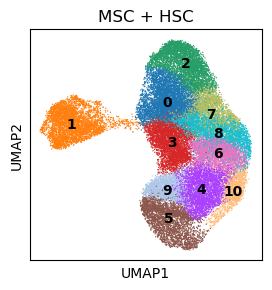

In [124]:
ax = sc.pl.umap(adata_sel_bbknn, color = ['leiden'], show = False, legend_loc = 'on data', title = 'MSC + HSC')
x_min, x_max = ax.get_xlim()
y_min, y_max = ax.get_ylim()


In [130]:
adata_sel

AnnData object with n_obs × n_vars = 34274 × 17175
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'leiden', 'ngfr_predicted_labels', 'ngfr_over_clustering', 'ngfr_majority_voting', 'ngfr_conf_score', 'wk4_predicted_labels', 'wk4_over_clustering', 'wk4_majority_voting', 'wk4_conf_score', 'wk6_predicted_labels', 'wk6_over_clustering', 'wk6_majority_voting', 'wk6_conf_score', 'wk8_predicted_labels', 'wk8_over_clustering', 'wk8_majority_voting', 'wk8_conf_score', 'oldway_predicted_labels', 'oldway_over_clustering', 'oldway_majority_voting', 'oldway_conf_score', 'dp_predicted_labels', 'dp_over_clustering', 'dp_majority_voting', 'dp_conf_score', 'hspc_predicted_labels', 'hspc_over_clustering', 'hspc_majority_voting', 'hspc_conf_score', 'celltype_d1_predicted_labels', 'celltype_d1_over_clustering', 'celltype_d1_majority_voting', 'celltype_d1_conf_score', 'hNFGR_predicted_labels', 'hN

In [134]:
adata_sel_updated = adata_sel.copy() 
adata_sel_updated.uns = adata_sel_bbknn.uns
adata_sel_updated.obs = adata_sel_bbknn.obs
adata_sel_updated.obsm['X_pca'] = adata_sel_bbknn.obsm['X_pca']
adata_sel_updated.obsm['X_umap'] = adata_sel_bbknn.obsm['X_umap']
adata_sel_updated.write_h5ad('data/adata_sel_udpate_may07.h5ad')


# RNA QC after filtering and merging

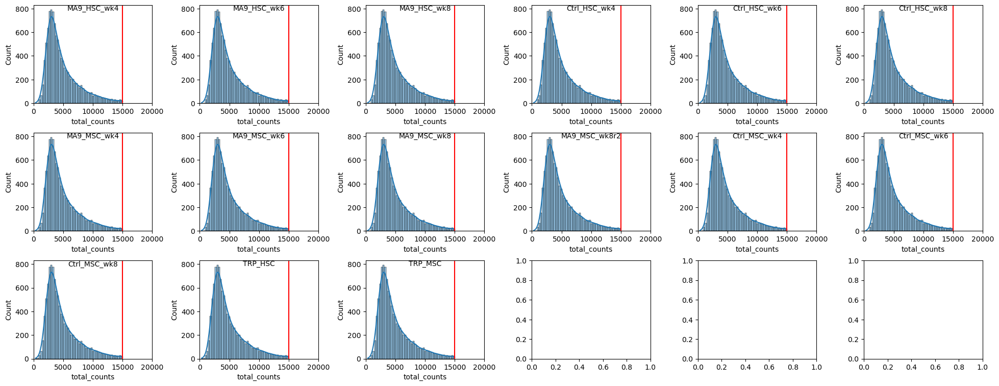

In [61]:
ncol = 6; nrow = 3; row_hight = 3; col_width = 4; wspace = 0.1; hspace = 0.4
fig, axes = plt.subplots(nrow , ncol, figsize=(ncol * col_width, nrow * row_hight) )
for ii, ax in enumerate(axes.flatten()):
    if ii == design.shape[0]:
        break
    else:
        ii_sample_name = design.loc[ii, 'sample_name']
        ii_title = design.loc[ii, 'sampleID']
        plotdat = adata_sel[adata_sel.obs['sampleID'] == 'H4']
        sns.histplot(plotdat.obs["total_counts"], kde=True, ax=ax)
        ax.set_xlim(0, 20000)
        xx = np.sum(ax.get_xlim()) / 2
        yy = np.max(ax.get_ylim())
        ax.text(x = xx, y = yy, s = ii_title, verticalalignment ='top', horizontalalignment ='center')
        ax.axvline(15000, color = 'red')
plt.subplots_adjust(hspace=0.3, wspace = .4)
plt.show()

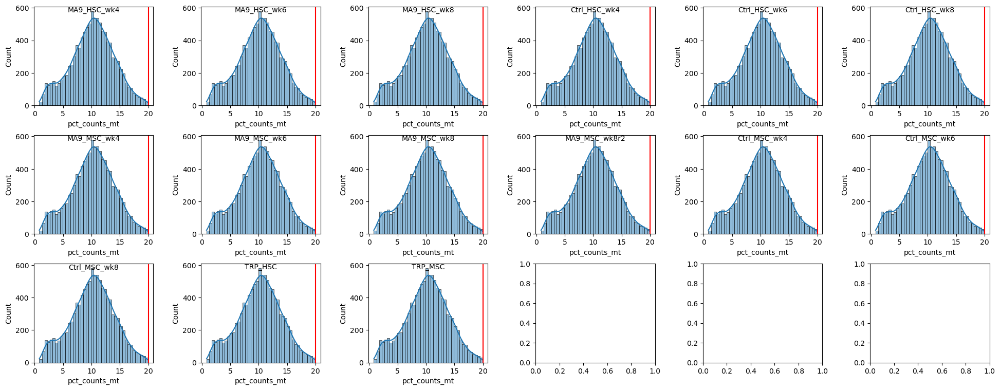

In [62]:
ncol = 6; nrow = 3; row_hight = 3; col_width = 4; wspace = 0.1; hspace = 0.4
fig, axes = plt.subplots(nrow , ncol, figsize=(ncol * col_width, nrow * row_hight) ) #ncol * figsize + (ncol - 1) * wspace * figsize, nrow * figsize + (nrow-1) * hspace * figsize) )
for ii, ax in enumerate(axes.flatten()):
    if ii == design.shape[0]:
        break
    else:
        ii_sample_name = design.loc[ii, 'sample_name']
        ii_title = design.loc[ii, 'sampleID']
        plotdat = adata_sel[adata_sel.obs['sampleID'] == 'H4']
        sns.histplot(plotdat.obs["pct_counts_mt"], kde=True, ax=ax)
        #ax.set_xlim(0, 20000)
        xx = np.sum(ax.get_xlim()) / 2
        yy = np.max(ax.get_ylim())
        ax.text(x = xx, y = yy, s = ii_title, verticalalignment ='top', horizontalalignment ='center')
        ax.axvline(20, color = 'red')
plt.subplots_adjust(hspace=0.3, wspace = .4)
plt.show()


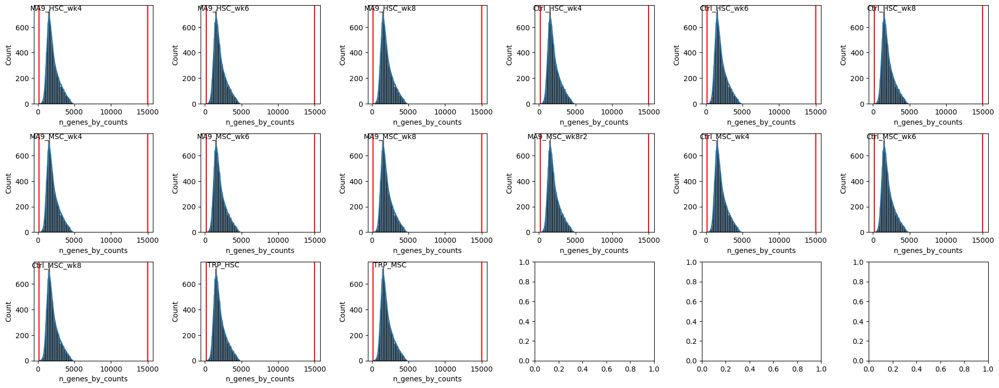

In [63]:
ncol = 6; nrow = 3; row_hight = 3; col_width = 4; wspace = 0.1; hspace = 0.4
fig, axes = plt.subplots(nrow , ncol, figsize=(ncol * col_width, nrow * row_hight) ) #ncol * figsize + (ncol - 1) * wspace * figsize, nrow * figsize + (nrow-1) * hspace * figsize) )
for ii, ax in enumerate(axes.flatten()):
    if ii == design.shape[0]:
        break
    else:
        ii_sample_name = design.loc[ii, 'sample_name']
        ii_title = design.loc[ii, 'sampleID']
        plotdat = adata_sel[adata_sel.obs['sampleID'] == 'H4']
        sns.histplot(plotdat.obs["n_genes_by_counts"], kde=True, ax=ax)
        #ax.set_xlim(0, 20000)
        xx = np.sum(ax.get_xlim()) / 2
        yy = np.max(ax.get_ylim())
        ax.text(x = xx, y = yy, s = ii_title, verticalalignment ='top', horizontalalignment ='center')
        ax.axvline(200, color = 'red')
        ax.axvline(15000, color = 'red')
plt.subplots_adjust(hspace=0.3, wspace = .4)
plt.show()


# plotting and examine MA9 genotype

(-7.513071942329407, 13.363958764076234)

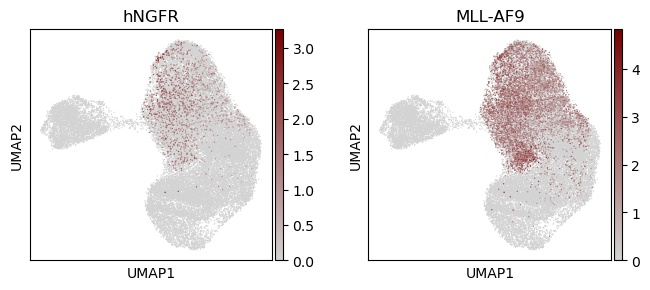

In [136]:
# try 0 3 8 6 7 5 9 
tmp = adata_sel_updated[adata_sel_updated.obs['leiden'].eq('1')]
ax = sc.pl.umap(adata_sel_updated, color = [ 'hNGFR', 'MLL-AF9'], show = False, legend_loc = 'on data', 
                                   cmap=sns.blend_palette(["lightgray", sns.xkcd_rgb["blood"]], as_cmap=True) ) 
ax[0].set_xlim(x_min, x_max)
ax[0].set_ylim(y_min, y_max)
ax[1].set_xlim(x_min, x_max)
ax[1].set_ylim(y_min, y_max)


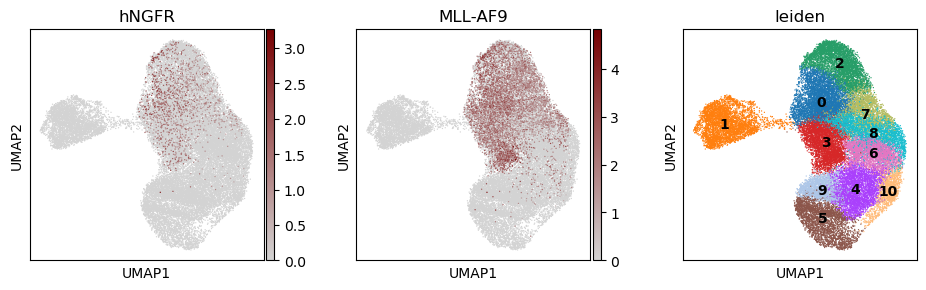

In [142]:
ax = sc.pl.umap(adata_sel_updated, color = [ 'hNGFR', 'MLL-AF9', 'leiden'], show = False, legend_loc = 'on data', 
                                   cmap=sns.blend_palette(["lightgray", sns.xkcd_rgb["blood"]], as_cmap=True) ) 


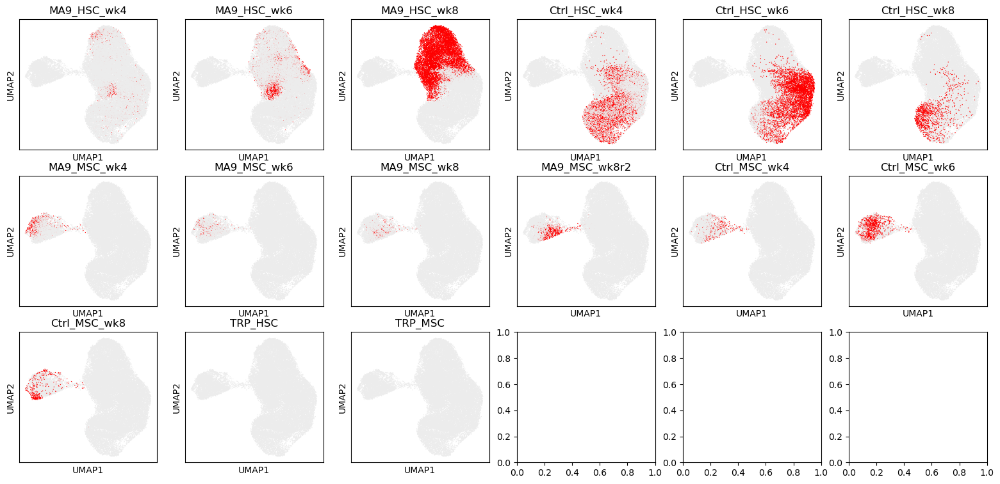

In [143]:
ncol = 6
nrow = 3
figsize = 3
wspace = 0.1 
fig, axes = plt.subplots(
    nrow, ncol, figsize=(ncol * figsize + (ncol - 1) * wspace * figsize, nrow * figsize)
)
#plt.subplots_adjust(wspace=wspace)

ll = 0
for i in range(nrow):
    for j in range(ncol):
        if ll == design.shape[0]:
            break
        else:
            palette = {ii : '#ECECEC' for ii in design['sample_name']} 
            ij_sample_name = design.loc[ll, 'sample_name']
            ij_title = design.loc[ll, 'sampleID']
            palette.update({ij_sample_name : 'red'})
            ax = sc.pl.umap(adata_sel_bbknn, color = 'sampleID', palette = palette, show = False, ax = axes[i][j], legend_loc = None, title = ij_title)
            ax.set_xlim((x_min, x_max))
            ax.set_ylim((y_min, y_max))
        ll += 1
plt.subplots_adjust()
plt.show()


In [ ]:
ncol = 3
nrow = 3
figsize = 3
wspace = 0.1 
fig, axes = plt.subplots(
    nrow, ncol, figsize=( ncol * figsize + (ncol - 1) * wspace * figsize, nrow * figsize)
)
#plt.subplots_adjust(wspace=wspace)
samples = design['sample_name'][range(0,3)].to_list()
colors = ['fake', 'leiden_ma9', 'leiden']

ll = 0
for ii in range(len(samples)):
    for jj in range(len(colors)):
        if ll == 9:
            break
        else:
            ij_sample_name = samples[ii]
            ij_color = colors[jj]
            if ij_color == 'fake':
                ij_color = 'wk' + str(4 + ii * 2) + '_predicted_labels'
            tmp = adata_sel_bbknn[adata_sel_bbknn.obs['sampleID'] == ij_sample_name]
            #ax = sc.pl.umap(tmp, color=['leiden'], show = False, ax = axes[i][j], title = ij_sample_name, legend_loc = None, size = 15)
            ax = sc.pl.umap(tmp, color=ij_color, show = False, size = 18, legend_loc = 'on data', ax = axes[ii][jj])
            ax.set_xlim((x_min, x_max))
            ax.set_ylim((y_min, y_max))
        ll += 1
plt.subplots_adjust()
plt.show()


In [ ]:
adata_singlet_bbknn.obs.to_csv('ma.csv')


In [ ]:
%%R -w 10 -h 10 -u cm
sid = 'H3'
celltypist = 'wk6_predicted_labels'
adata_singlet_obs = fread('ma.csv')
mtx = as.data.frame(table(adata_sel_bbknn[sampleID == sid, c('leiden_ma9', celltypist), with = F]))
mtx = melt(mtx)
ggplot(mtx, aes_string('leiden_ma9', celltypist, fill= 'value', label='value')) +  geom_tile() + theme_pubr() + geom_text() + scale_fill_gradient(low = "white", high = "red")



In [ ]:
tmp1 = adata_singlet_bbknn[adata_singlet_bbknn.obs['sampleID'] == 'H3']
tmp1 = tmp1[tmp1.obs['wk6_predicted_labels'] == 'WT']
tmp1 = tmp1[tmp1.obs['leiden_ma9'] == 'leiden_ma9']

tmp2 = adata_singlet_bbknn[adata_singlet_bbknn.obs['sampleID'] == 'H3']
tmp2 = tmp2[tmp2.obs['wk6_predicted_labels'] == 'MA9']
tmp2 = tmp2[tmp2.obs['leiden_ma9'] != 'leiden_ma9']

tmp = ad.concat([tmp1, tmp2])

ax = sc.pl.umap(tmp, color=['wk6_predicted_labels', 'leiden_ma9', 'leiden'], show = False, size = 18, legend_loc = None)
ax[0].set_xlim((x_min, x_max))
ax[0].set_ylim((y_min, y_max))
ax[1].set_xlim((x_min, x_max))
ax[1].set_ylim((y_min, y_max))
ax[2].set_xlim((x_min, x_max))
ax[2].set_ylim((y_min, y_max))


(-9.253910541534424, 12.618536472320557)

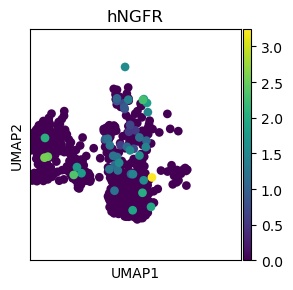

In [220]:
nm = adata_full_bbknn[tmp.to_df().index]
ax = sc.pl.umap(nm, color = 'hNGFR', show = False)
ax.set_xlim((x_min, x_max))
ax.set_ylim((y_min, y_max))



In [214]:
# hNFGR and MLL-AF9 both detected as 1
nm_mtx = adata_rna_full[tmp.to_df().index].to_df()
nm_obs = adata_rna_full[tmp.to_df().index].obs.copy()
# hNFGR and MLL-AF9 both detected as 1
nm_obs['hNGFR_positive'] = nm_mtx['hNGFR'] > 0 
nm_obs['MLLAF9_positive'] = nm_mtx['MLL-AF9'] > 0 
nm_obs['leiden_ma9'] =  all_obs.loc[nm_obs.index, 'leiden_ma9']

nm_obs[['hNGFR_positive', 'wk4_majority_voting']].value_counts()
nm_obs[['hNGFR_positive', 'leiden_ma9']].value_counts()
#hh.to_df()[nm, :]

hNGFR_positive  leiden_ma9
False           leiden_ma9    568
                None          150
True            None           33
                leiden_ma9     12
Name: count, dtype: int64

In [ ]:
tmp.obs['']

In [ ]:
%%R -w 10 -h 10 -u cm
library(ggpubr)
mtx = as.data.frame(table(adata_full_obs[sampleID == 'H3', .(leiden_ma9, wk4_predicted_labels)]))
mtx = melt(mtx)
ggplot(mtx, aes(leiden_ma9, wk6_predicted_labels, fill= value, label=value)) +  geom_tile() + theme_pubr() + geom_text() + scale_fill_gradient(low = "white", high = "red")


In [ ]:
%%R -w 10 -h 10 -u cm
mtx = as.data.frame(table(adata_full_obs[sampleID == 'H2', .(leiden_ma9, wk4_predicted_labels)]))
mtx = melt(mtx)
ggplot(mtx, aes(leiden_ma9, wk4_predicted_labels, fill= value, label=value)) +  geom_tile() + theme_pubr() + geom_text() + scale_fill_gradient(low = "white", high = "red")


R[write to console]: Using leiden_ma9, wk6_predicted_labels as id variables



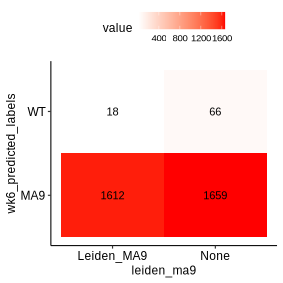

In [264]:
%%R -w 10 -h 10 -u cm
mtx = as.data.frame(table(adata_singlet_obs[sampleID == 'H3', .(leiden_ma9, wk6_predicted_labels)]))
mtx = melt(mtx)
ggplot(mtx, aes(leiden_ma9, wk6_predicted_labels, fill= value, label=value)) +  geom_tile() + theme_pubr() + geom_text() + scale_fill_gradient(low = "white", high = "red")


In [269]:
xx = adata_singlet_bbknn.obs 

In [271]:
xx[['leiden_ma9', 'wk8_predicted_labels', 'leiden']]

leiden_ma9 wk8_predicted_labels leiden
AAACAGCCAGCGCTTG-1_H2       leiden_ma9                   WT      6
AAACAGCCAGCTACGT-1_H2             None                   WT      0
AAACATGCACCACAAC-1_H2       leiden_ma9                  MA9      6
AAACATGCATAGCTGC-1_H2             None                   WT      0
AAACCAACAAAGCCTC-1_H2       leiden_ma9                   WT      6
...                                ...                  ...    ...
TTTGGTGCACACAATT-1_trp_m90        None                   WT      3
TTTGTCCCACCTGGTG-1_trp_m90        None                   WT      3
TTTGTCCCAGGAACTG-1_trp_m90        None                   WT      3
TTTGTGGCAGCCAGAA-1_trp_m90        None                   WT      3
TTTGTTGGTCCTTAGT-1_trp_m90        None                   WT     10

[58165 rows x 3 columns]

R[write to console]: Using leiden_ma9, wk8_predicted_labels as id variables



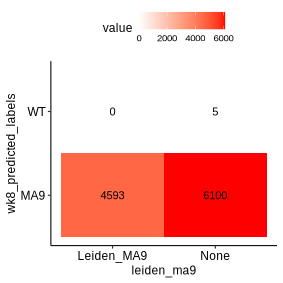

In [266]:
%%R -w 10 -h 10 -u cm
mtx = as.data.frame(table(adata_singlet_obs[sampleID == 'H4', .(leiden_ma9, wk8_predicted_labels)]))
mtx = melt(mtx)
ggplot(mtx, aes(leiden_ma9, wk8_predicted_labels, fill= value, label=value)) +  geom_tile() + theme_pubr() + geom_text() + scale_fill_gradient(low = "white", high = "red")
